# Indoor Human Walking Path Reconstruction from a FMWC Radar Signal
## Preprocessing and Features Extraction

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h5py
import numpy as np
import argparse
import random
import seaborn as sns
import pickle

import process
import clustering as clr
import denoising as dns

random.seed(123)

## Importing Data
In this first step we import raw data and extract the _Range Doppler_ plot for all the frames belonging to a single user labeled by 'CODE'. 

In [2]:
PATH = '/home/domenico/Documenti/Human_data_analytics/project/idrad/train/'
CODE = '4_040'

hdf = h5py.File(PATH+'target'+CODE+'.hdf5','r')

In [3]:
x = np.array(hdf['radar'])
r = process.range_doppler(x[1])

n_frame = x.shape[0]
dim = r.shape

Image n. 0


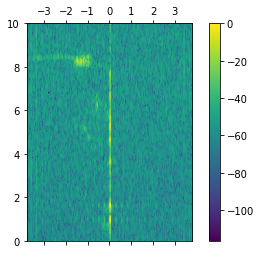

Image n. 1


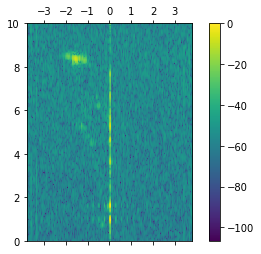

Image n. 2


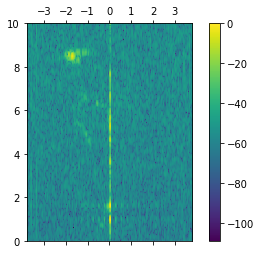

Image n. 3


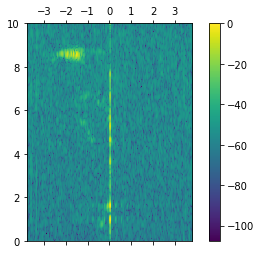

Image n. 4


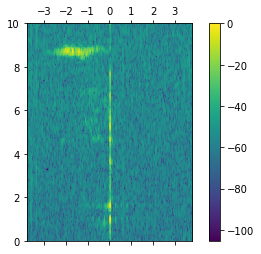

Image n. 5


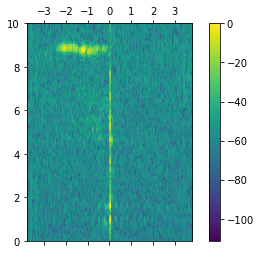

Image n. 6


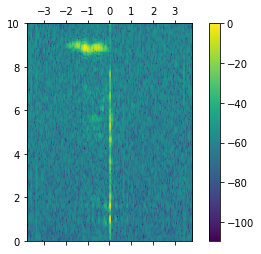

Image n. 7


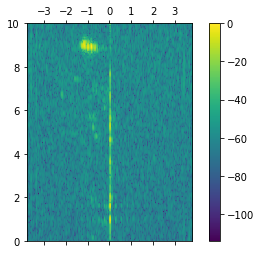

Image n. 8


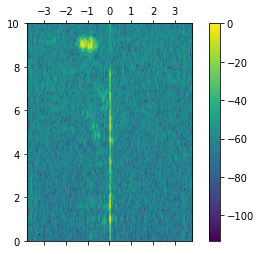

Image n. 9


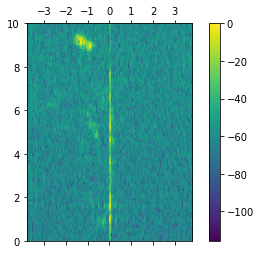

Image n. 10


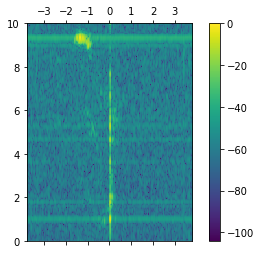

Image n. 11


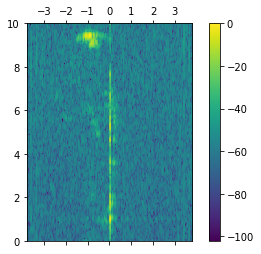

Image n. 12


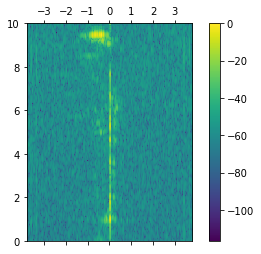

Image n. 13


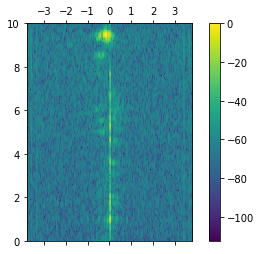

Image n. 14


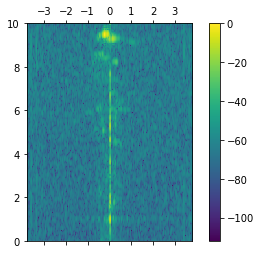

Image n. 15


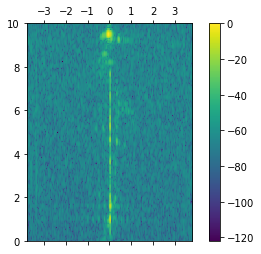

Image n. 16


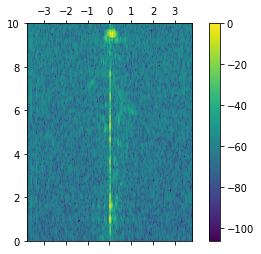

Image n. 17


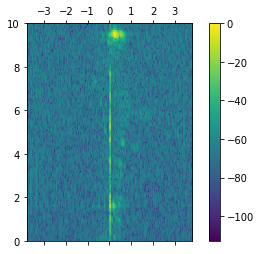

Image n. 18


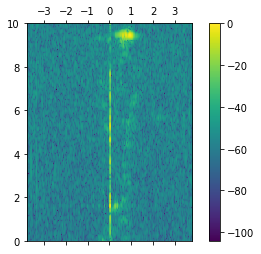

Image n. 19


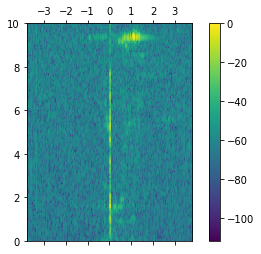

Image n. 20


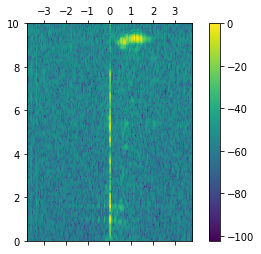

Image n. 21


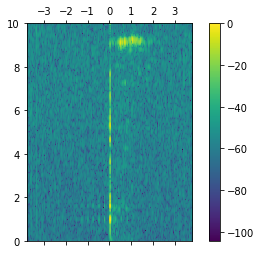

Image n. 22


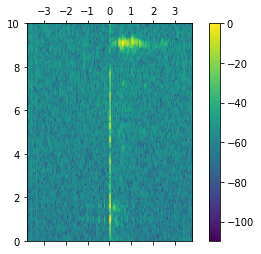

Image n. 23


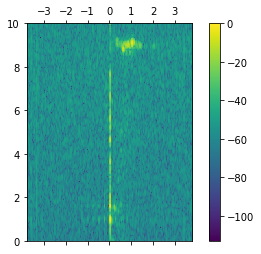

Image n. 24


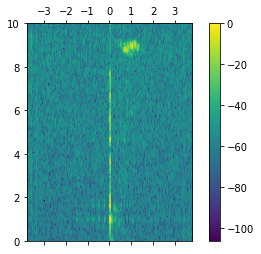

Image n. 25


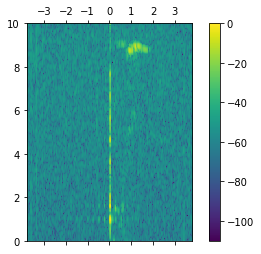

Image n. 26


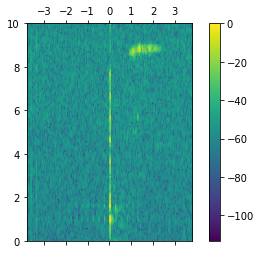

Image n. 27


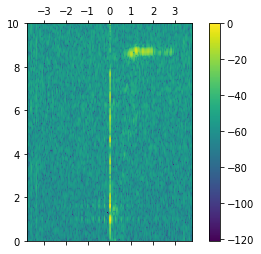

Image n. 28


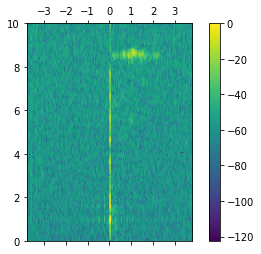

Image n. 29


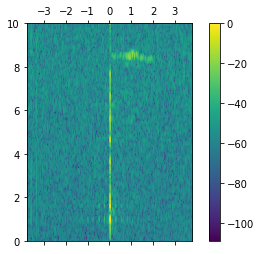

Image n. 30


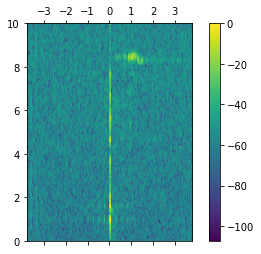

Image n. 31


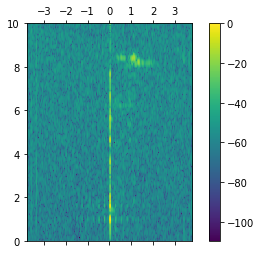

Image n. 32


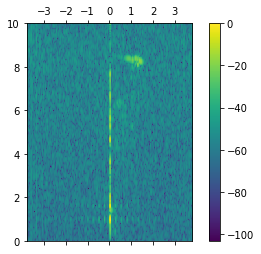

Image n. 33


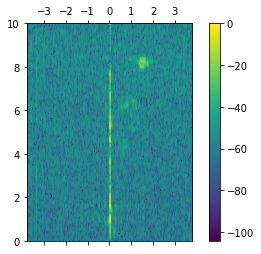

Image n. 34


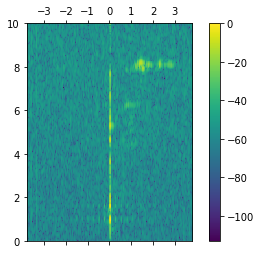

Image n. 35


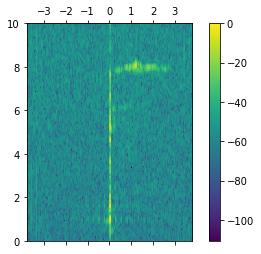

Image n. 36


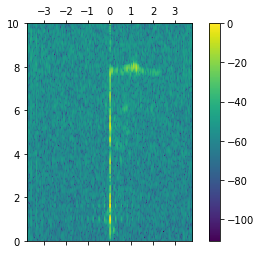

Image n. 37


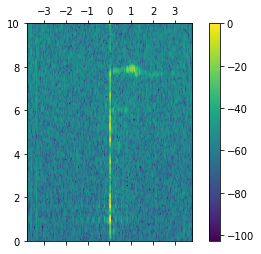

Image n. 38


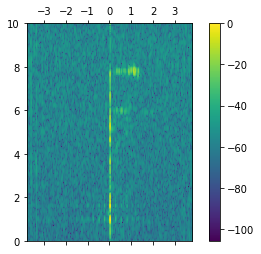

Image n. 39


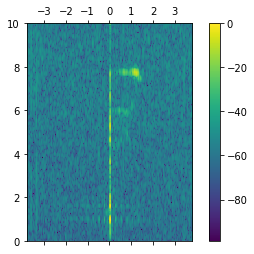

Image n. 40


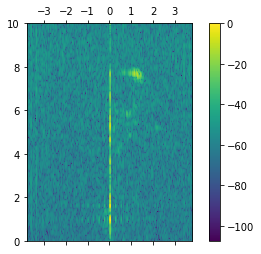

Image n. 41


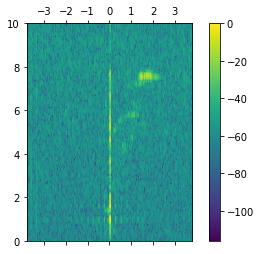

Image n. 42


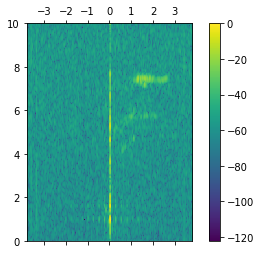

Image n. 43


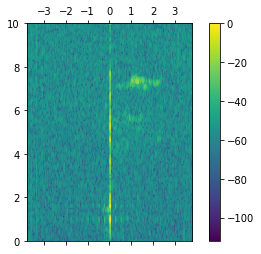

Image n. 44


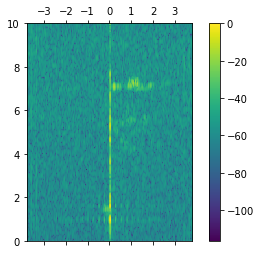

Image n. 45


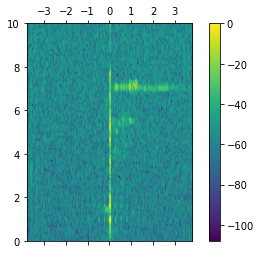

Image n. 46


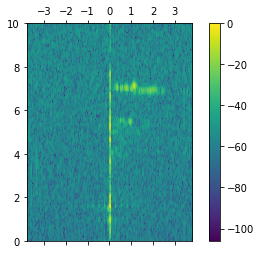

Image n. 47


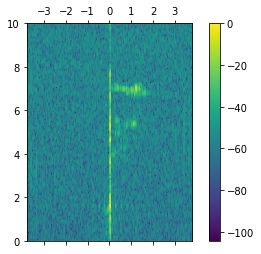

Image n. 48


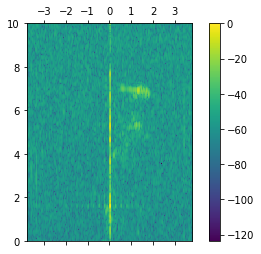

Image n. 49


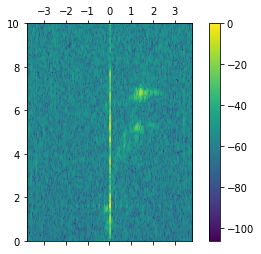

Image n. 50


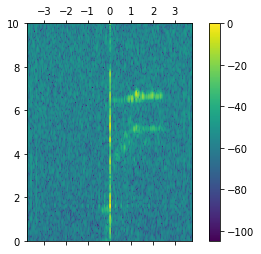

Image n. 51


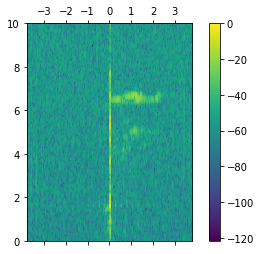

Image n. 52


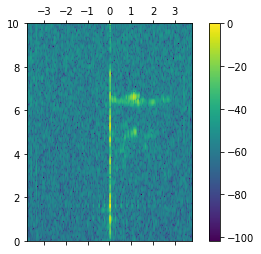

Image n. 53


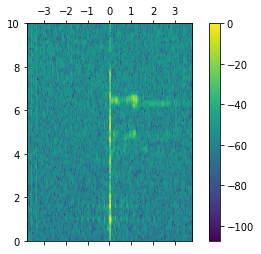

Image n. 54


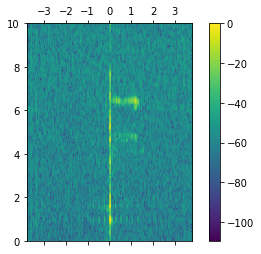

Image n. 55


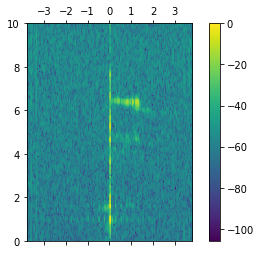

Image n. 56


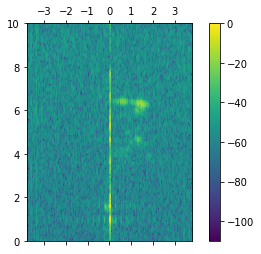

Image n. 57


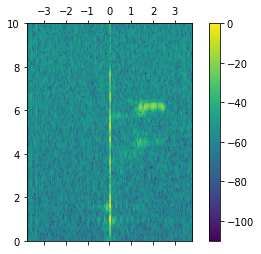

Image n. 58


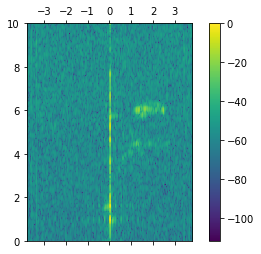

Image n. 59


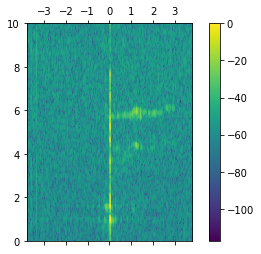

Image n. 60


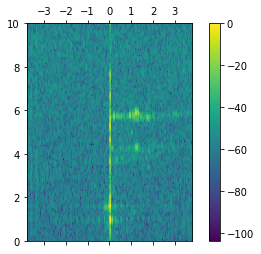

Image n. 61


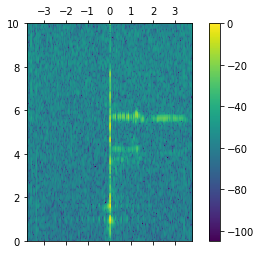

Image n. 62


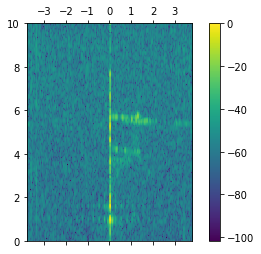

Image n. 63


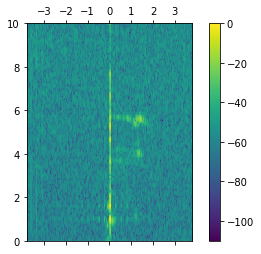

Image n. 64


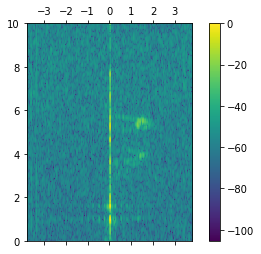

Image n. 65


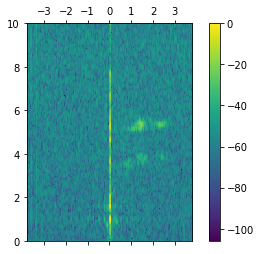

Image n. 66


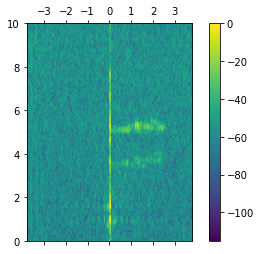

Image n. 67


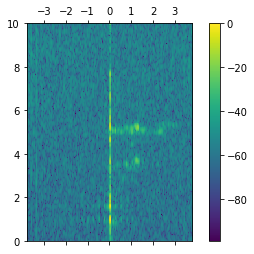

Image n. 68


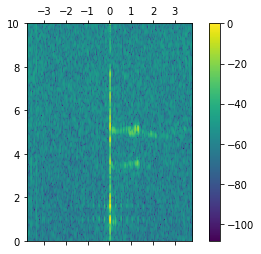

Image n. 69


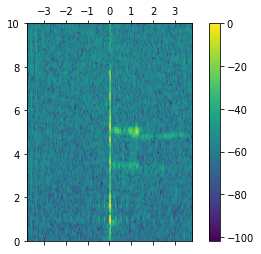

Image n. 70


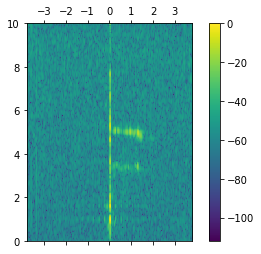

Image n. 71


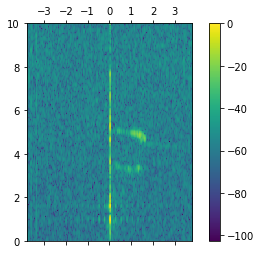

Image n. 72


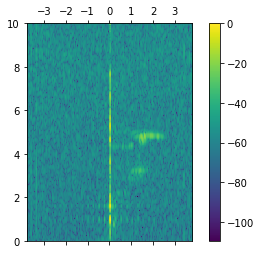

Image n. 73


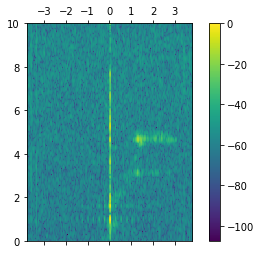

Image n. 74


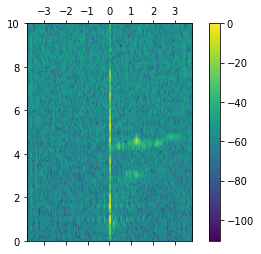

Image n. 75


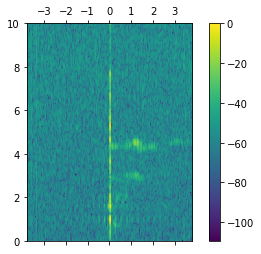

Image n. 76


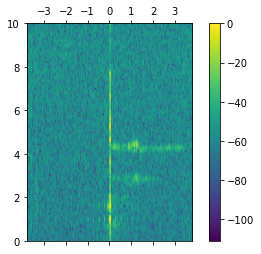

Image n. 77


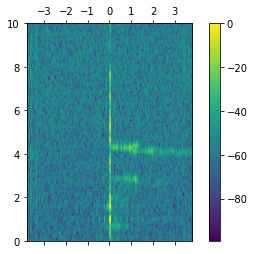

Image n. 78


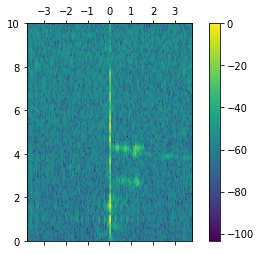

Image n. 79


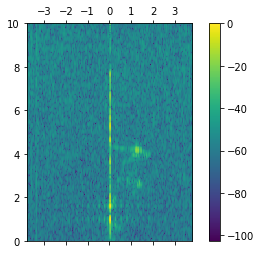

Image n. 80


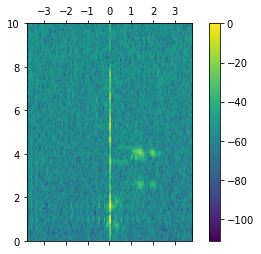

Image n. 81


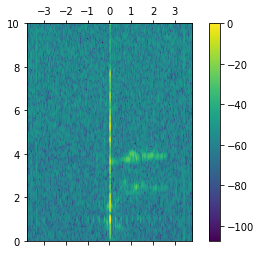

Image n. 82


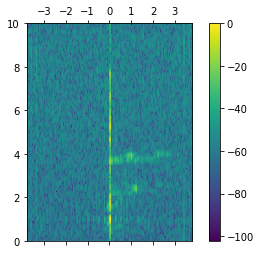

Image n. 83


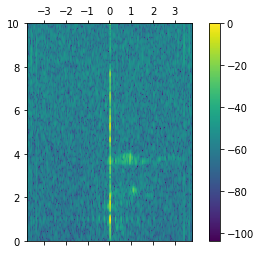

Image n. 84


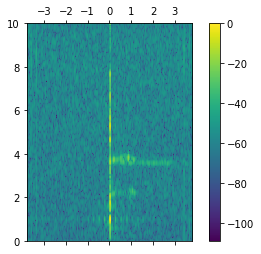

Image n. 85


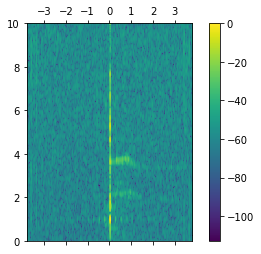

Image n. 86


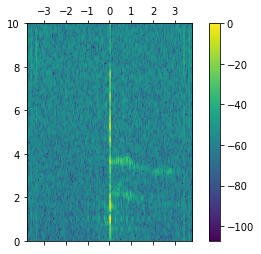

Image n. 87


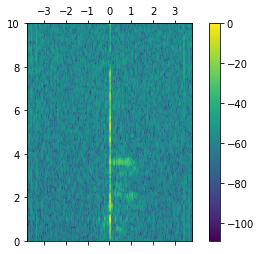

Image n. 88


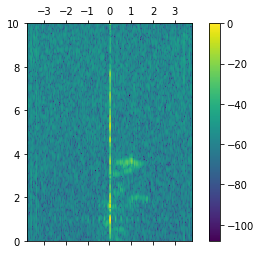

Image n. 89


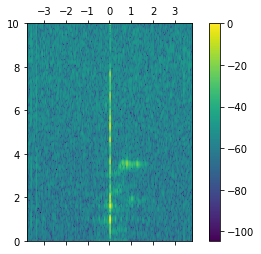

Image n. 90


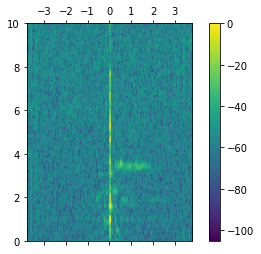

Image n. 91


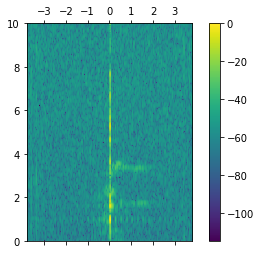

Image n. 92


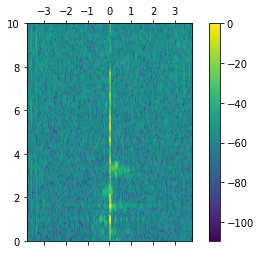

Image n. 93


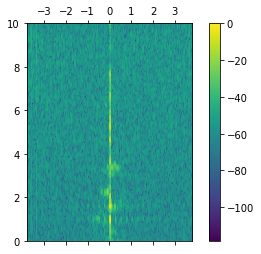

Image n. 94


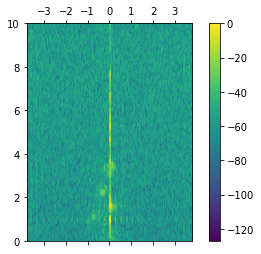

Image n. 95


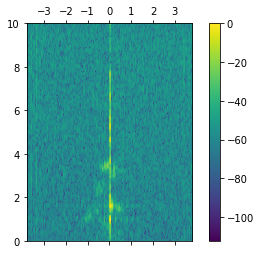

Image n. 96


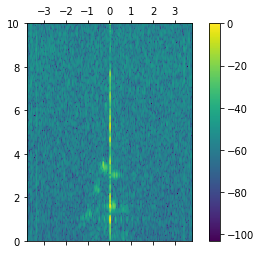

Image n. 97


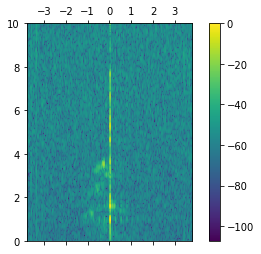

Image n. 98


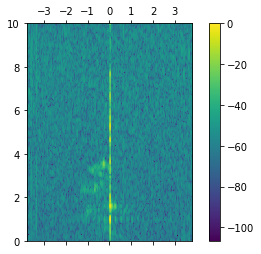

Image n. 99


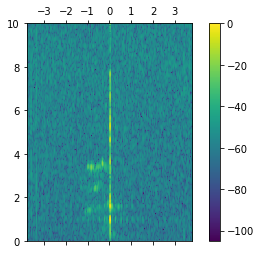

Image n. 100


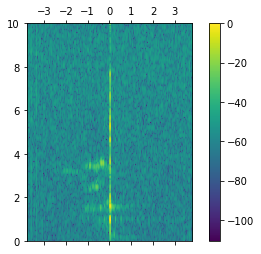

Image n. 101


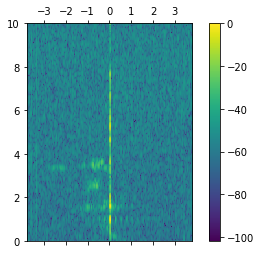

Image n. 102


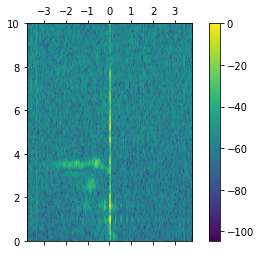

Image n. 103


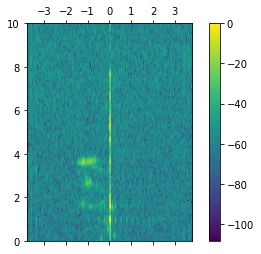

Image n. 104


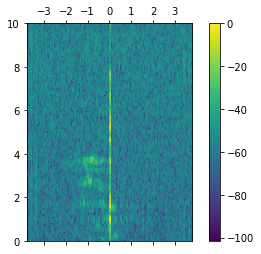

Image n. 105


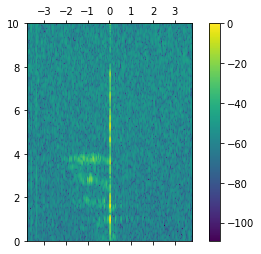

Image n. 106


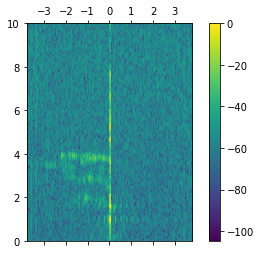

Image n. 107


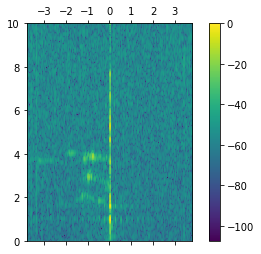

Image n. 108


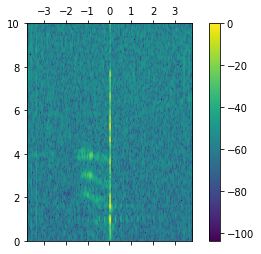

Image n. 109


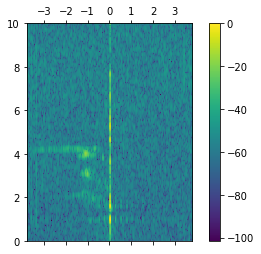

Image n. 110


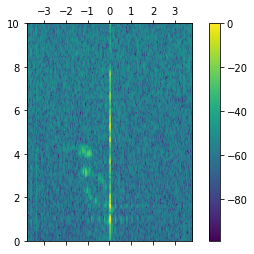

Image n. 111


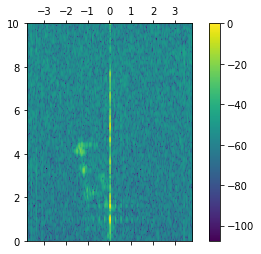

Image n. 112


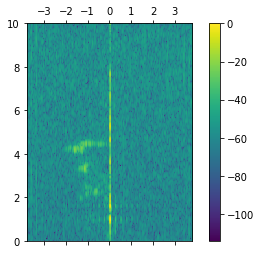

Image n. 113


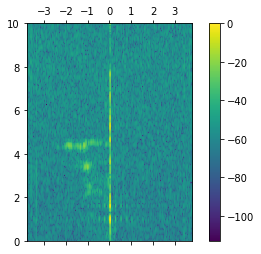

Image n. 114


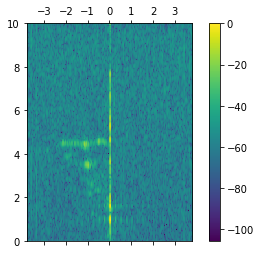

Image n. 115


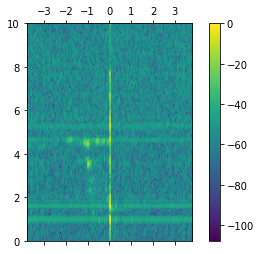

Image n. 116


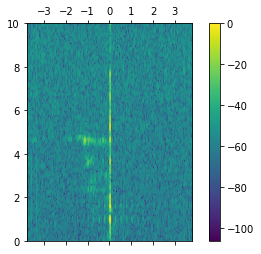

Image n. 117


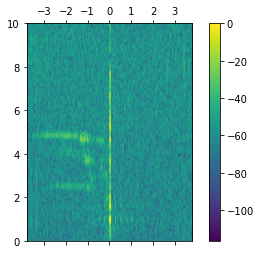

Image n. 118


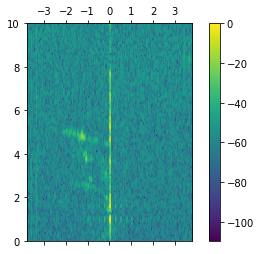

Image n. 119


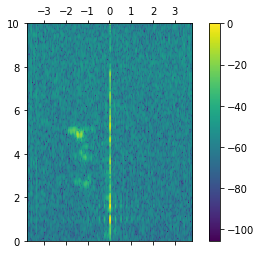

Image n. 120


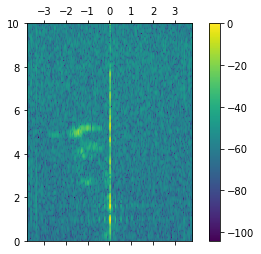

Image n. 121


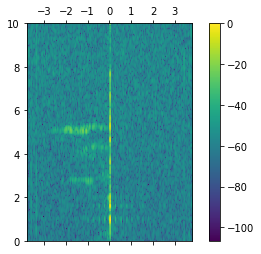

Image n. 122


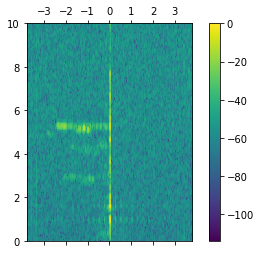

Image n. 123


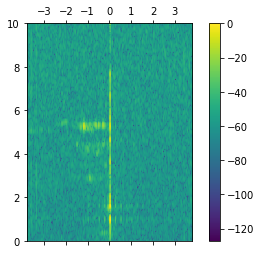

Image n. 124


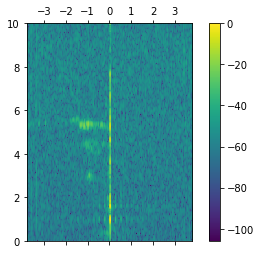

Image n. 125


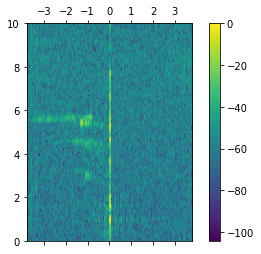

Image n. 126


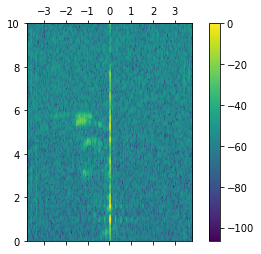

Image n. 127


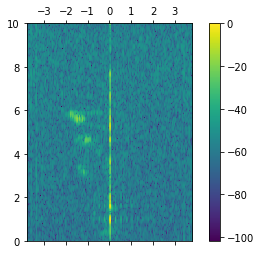

Image n. 128


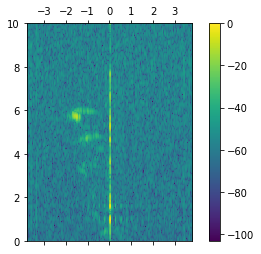

Image n. 129


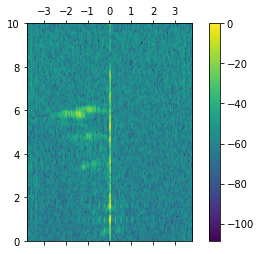

Image n. 130


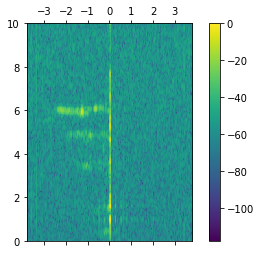

Image n. 131


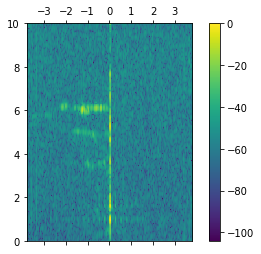

Image n. 132


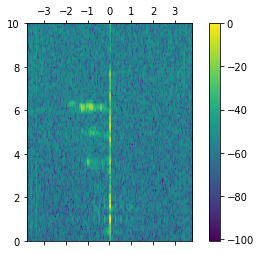

Image n. 133


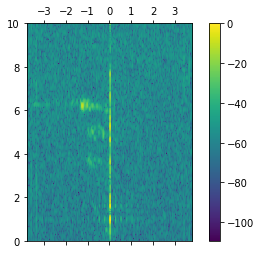

Image n. 134


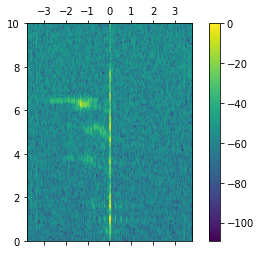

Image n. 135


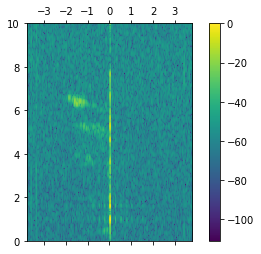

Image n. 136


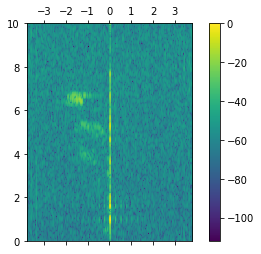

Image n. 137


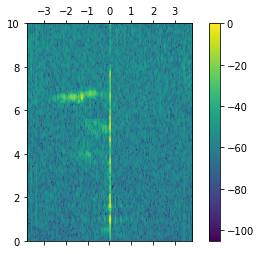

Image n. 138


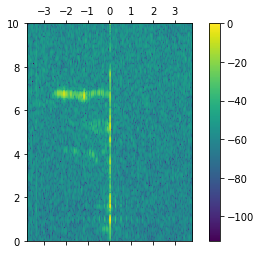

Image n. 139


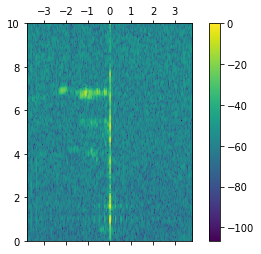

Image n. 140


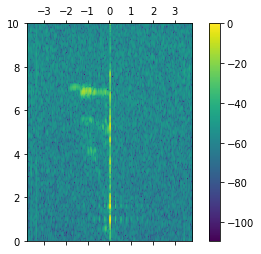

Image n. 141


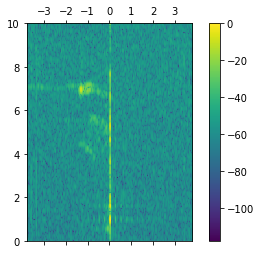

Image n. 142


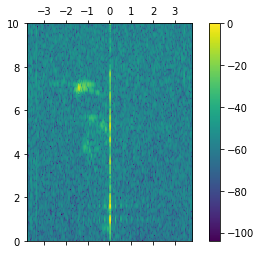

Image n. 143


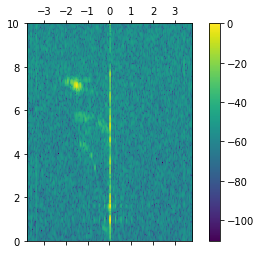

Image n. 144


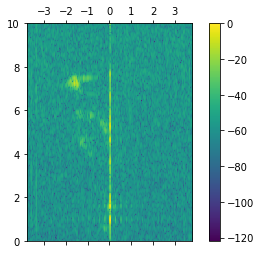

Image n. 145


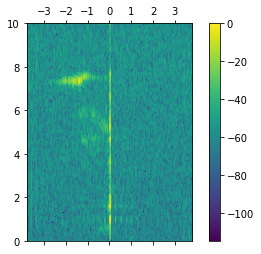

Image n. 146


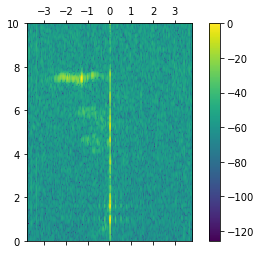

Image n. 147


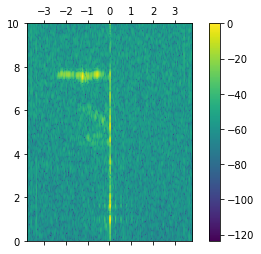

Image n. 148


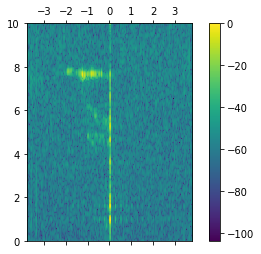

Image n. 149


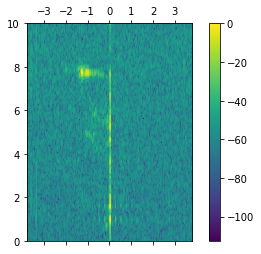

Image n. 150


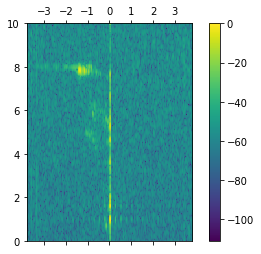

Image n. 151


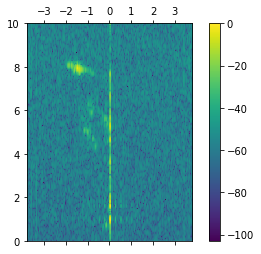

Image n. 152


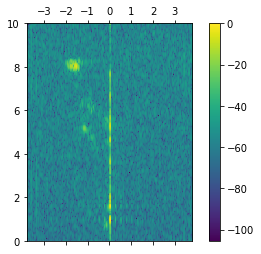

Image n. 153


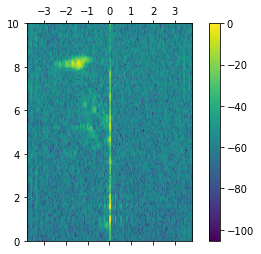

Image n. 154


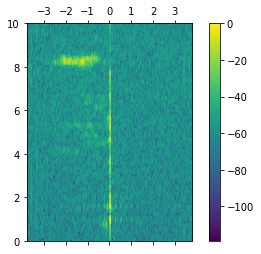

Image n. 155


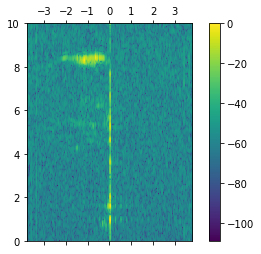

Image n. 156


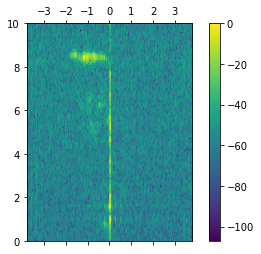

Image n. 157


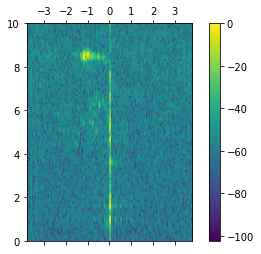

Image n. 158


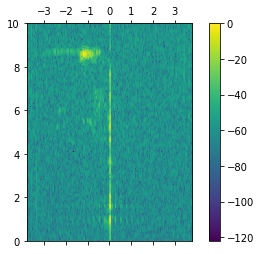

Image n. 159


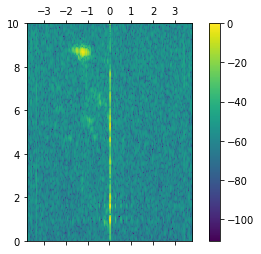

Image n. 160


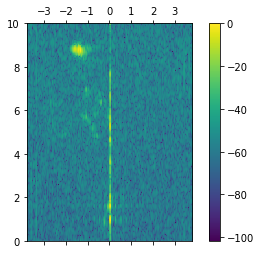

Image n. 161


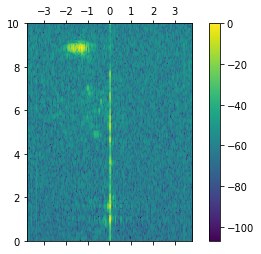

Image n. 162


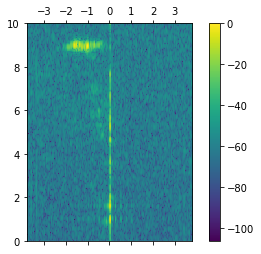

Image n. 163


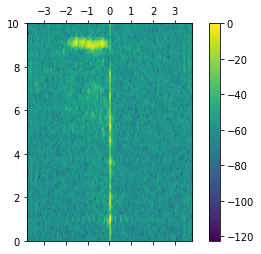

Image n. 164


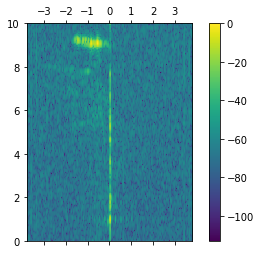

Image n. 165


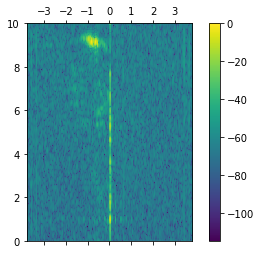

Image n. 166


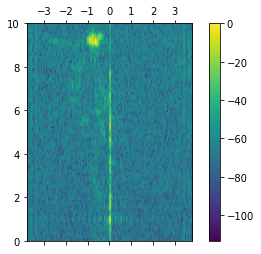

Image n. 167


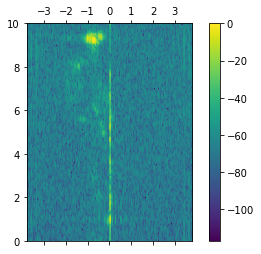

Image n. 168


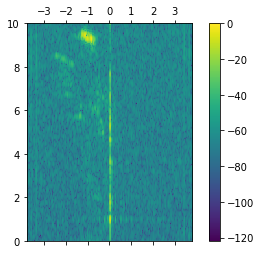

Image n. 169


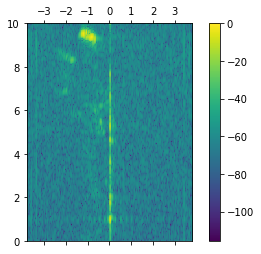

Image n. 170


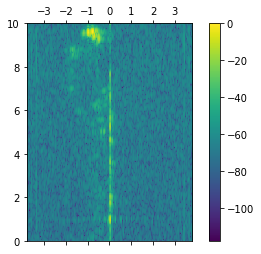

Image n. 171


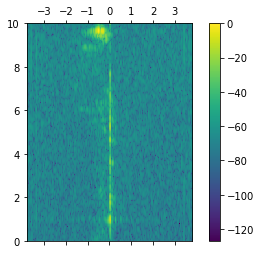

Image n. 172


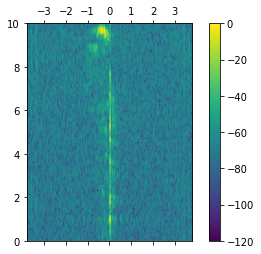

Image n. 173


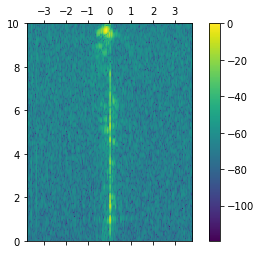

Image n. 174


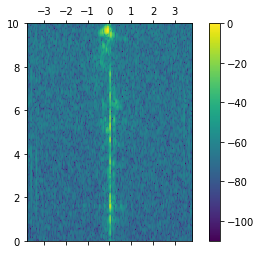

Image n. 175


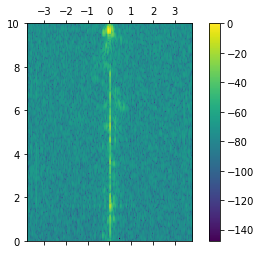

Image n. 176


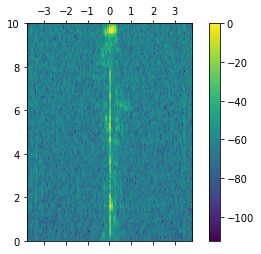

Image n. 177


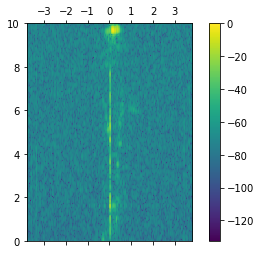

Image n. 178


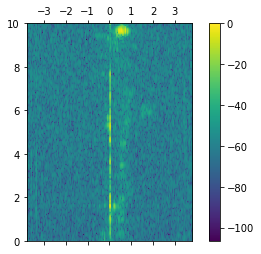

In [47]:
# create an array of RD maps from a file

rda = np.empty((n_frame, dim[0], dim[1]))

for ind in range(n_frame):
    r = process.range_doppler(x[ind])
    rd = np.array(20 * np.log10(r))
    rd -= rd.max()
    #rd[rd < -45] = -45
    
    rda[ind,:,:] = rd    

Image n. 0


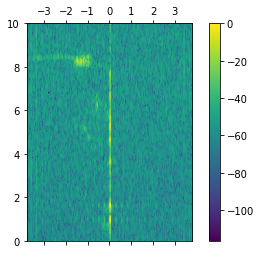

Image n. 1


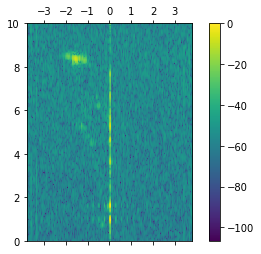

Image n. 2


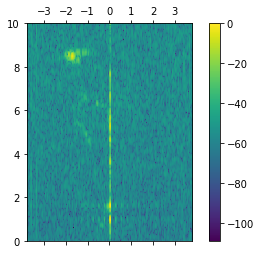

Image n. 3


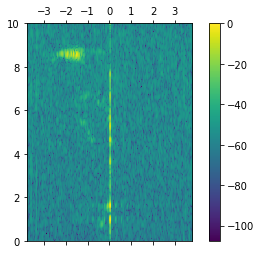

Image n. 4


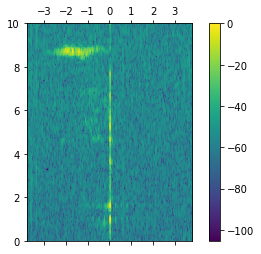

Image n. 5


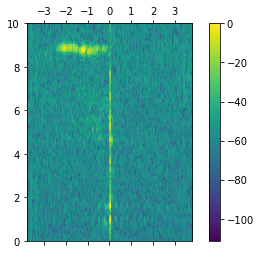

Image n. 6


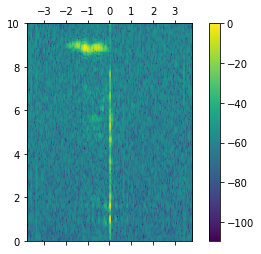

Image n. 7


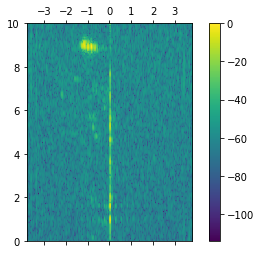

Image n. 8


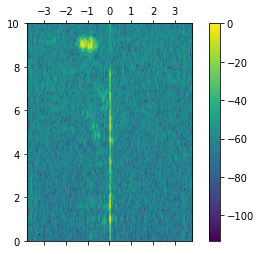

Image n. 9


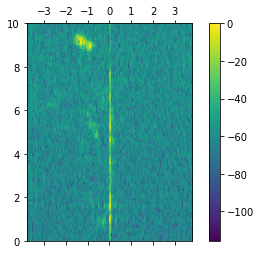

In [48]:
for ind in range(10):
    
    print('Image n.',ind)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(rda[ind, :, :], extent=[-3.8,3.8,0,10])
    fig.colorbar(cax)
    plt.show()

In [49]:
# saving the some in the file som.p
with open(PATH+'rda'+CODE+'.p', 'wb') as outfile:
    pickle.dump(rda, outfile)

In [50]:
# load the pickle file
with open(PATH+'rda'+CODE+'.p', 'rb') as infile:
    rda = pickle.load(infile)

## Thresholding
### Example

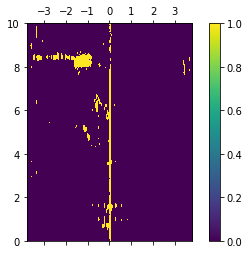

In [59]:
ind = 0 # index of the frame
valore = -45 # optimal threshold for intensity

X = rda[ind]

fig = plt.figure()
ax = fig.add_subplot(111)

cax = ax.matshow((X>valore)*1, extent=[-3.8,3.8,0,10])

fig.colorbar(cax)
plt.show()

We want to estimate a threshold in order to discriminate the peacks of
intensity from the background as shown in the previous image. We propose two
methods:

1. The number of selected points is plotted against the threshold. The curve presents a steep descent in correspondence of the intensity values that are more frequent. This plot is stable varing the selected image. A good choice for the threshold has prooven to be a value of intensity just after the steep region of the curve.
2. A value of intensity that leaves the 2-3% of the distribution to the right tail has proven to be a valid threshold.

### First method

In [56]:
import scipy
import time

0.03558778762817383


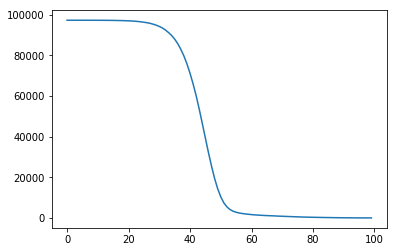

In [62]:
# print the density curve of a boolean image with respect to the threshold
start = time.time()

t = np.zeros((100, 1))
for i in range(100):
    t[i] = (X>-100+i).sum()
min_val = np.argmin(np.abs(t - 2000), axis=0)
t_min = -100 + min_val

end = time.time()
print(end - start)
plt.plot(t)
plt.show()

Image n. 0


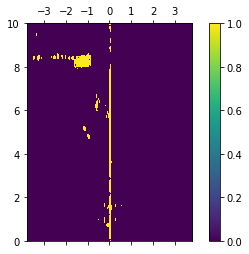

Image n. 1


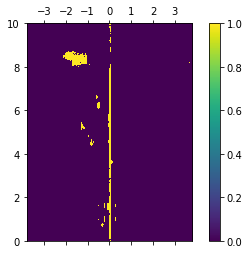

Image n. 2


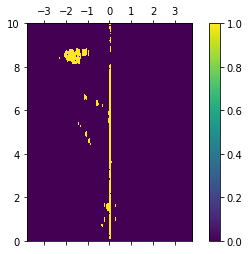

Image n. 3


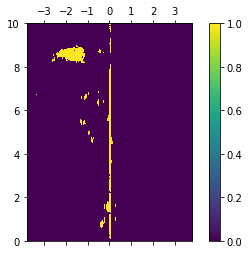

Image n. 4


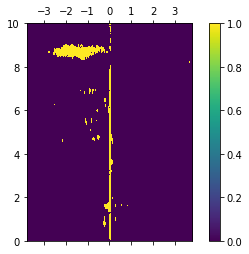

Image n. 5


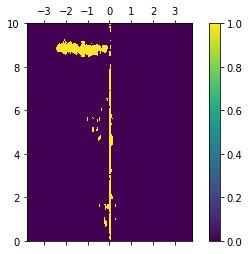

Image n. 6


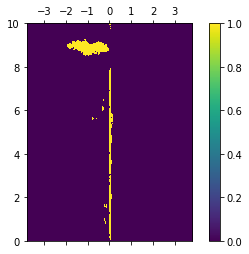

Image n. 7


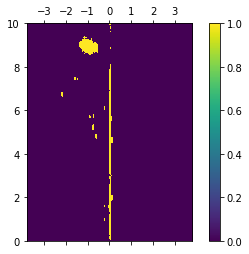

Image n. 8


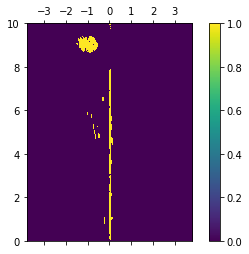

Image n. 9


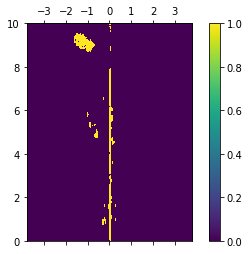

Image n. 10


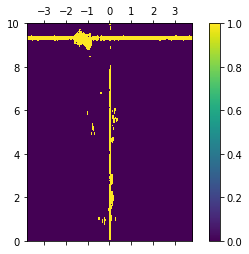

Image n. 11


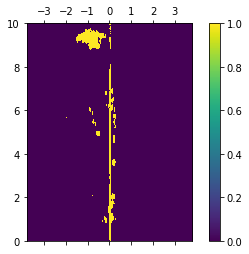

Image n. 12


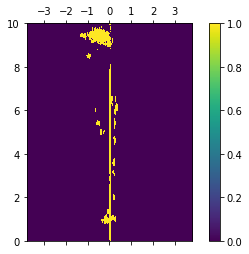

Image n. 13


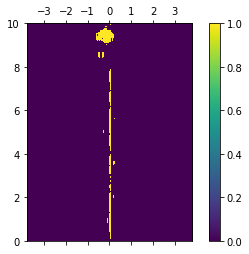

Image n. 14


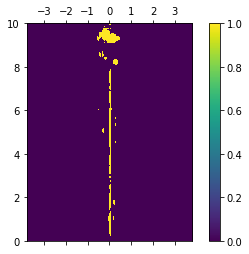

Image n. 15


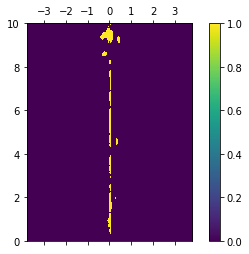

Image n. 16


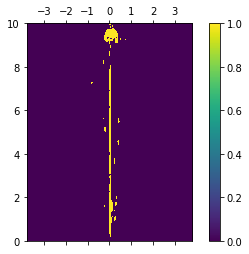

Image n. 17


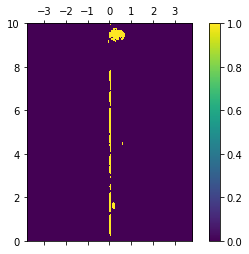

Image n. 18


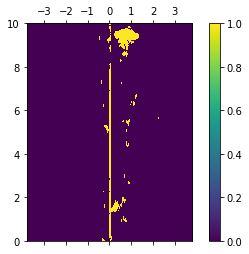

Image n. 19


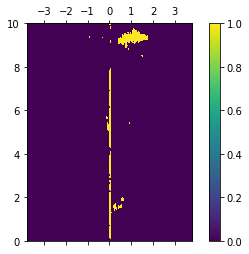

Image n. 20


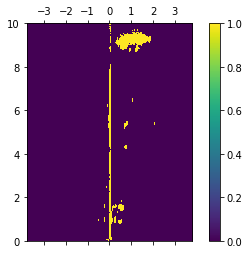

Image n. 21


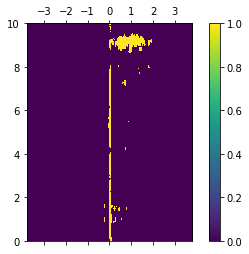

Image n. 22


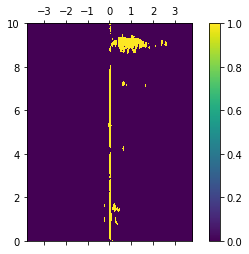

Image n. 23


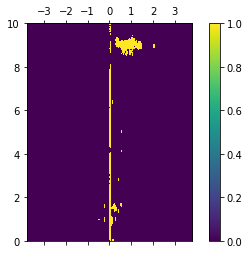

Image n. 24


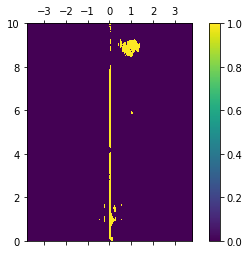

Image n. 25


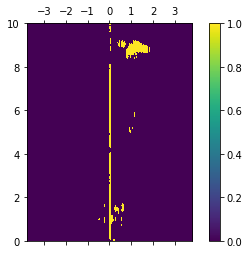

Image n. 26


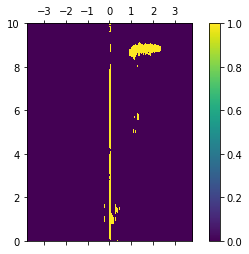

Image n. 27


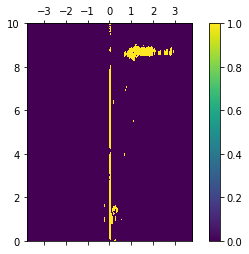

Image n. 28


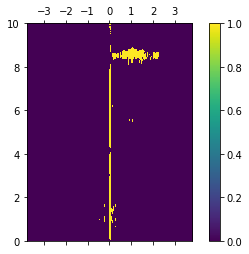

Image n. 29


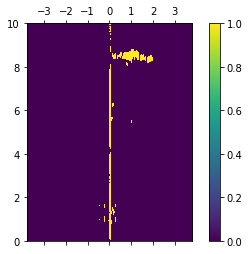

Image n. 30


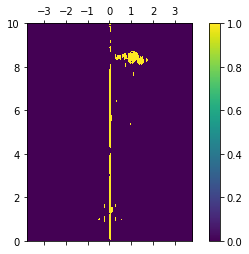

Image n. 31


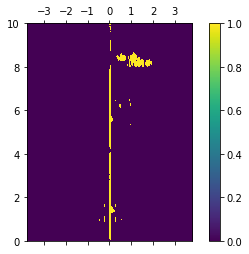

Image n. 32


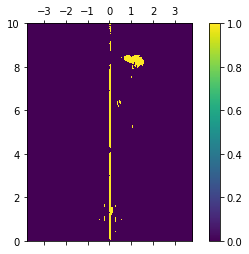

Image n. 33


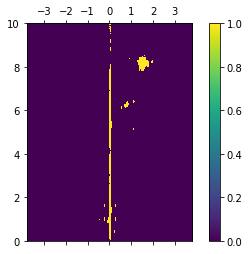

Image n. 34


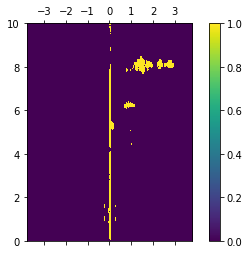

Image n. 35


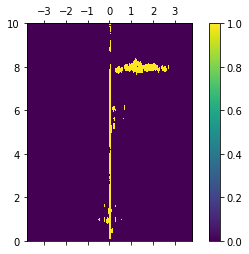

Image n. 36


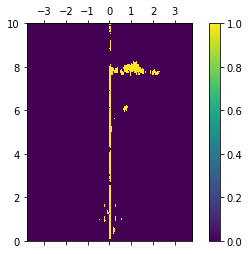

Image n. 37


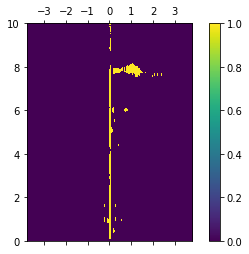

Image n. 38


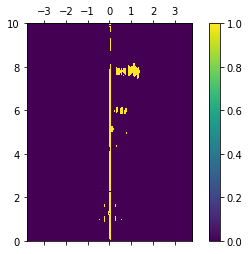

Image n. 39


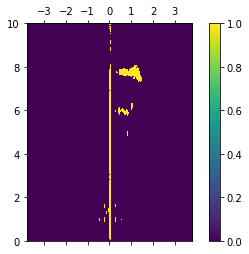

Image n. 40


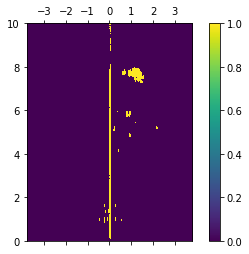

Image n. 41


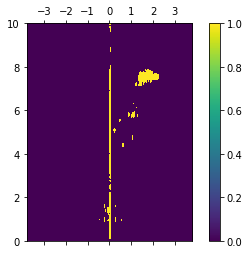

Image n. 42


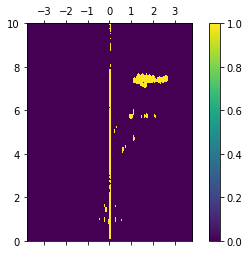

Image n. 43


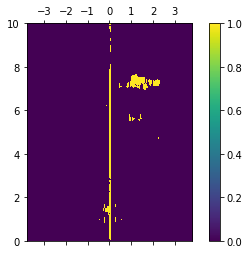

Image n. 44


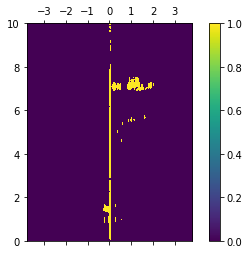

Image n. 45


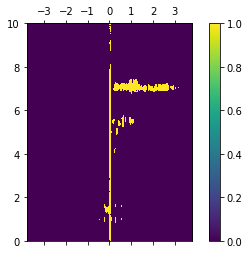

Image n. 46


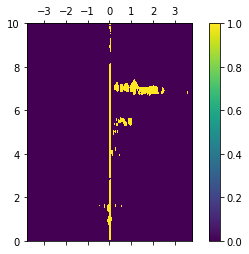

Image n. 47


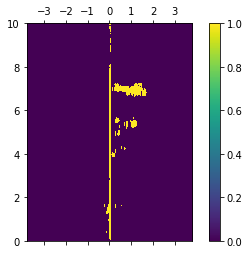

Image n. 48


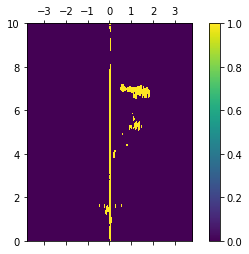

Image n. 49


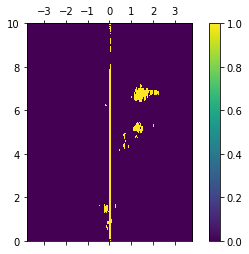

Image n. 50


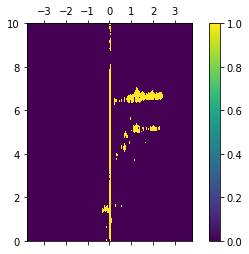

Image n. 51


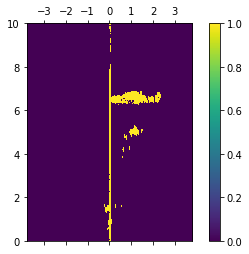

Image n. 52


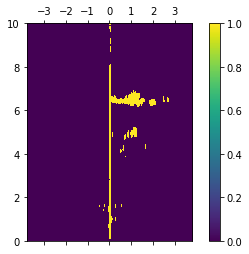

Image n. 53


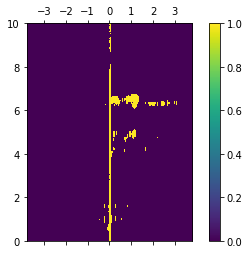

Image n. 54


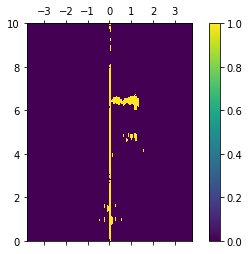

Image n. 55


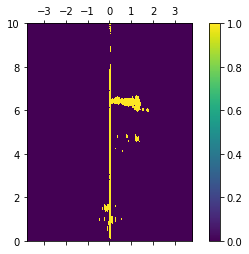

Image n. 56


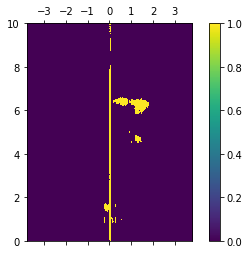

Image n. 57


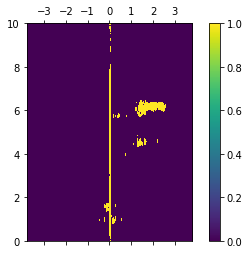

Image n. 58


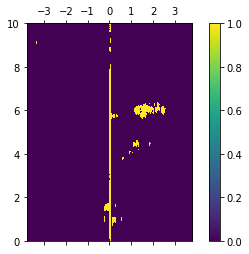

Image n. 59


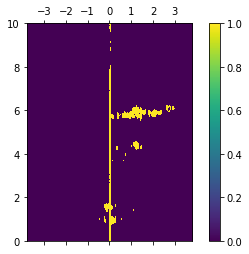

Image n. 60


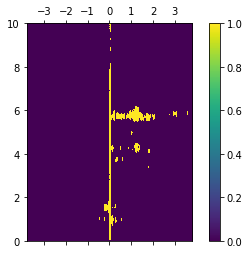

Image n. 61


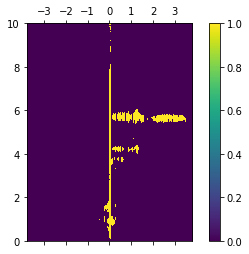

Image n. 62


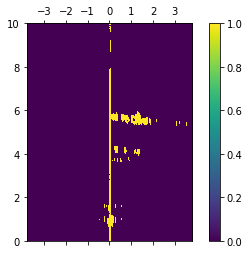

Image n. 63


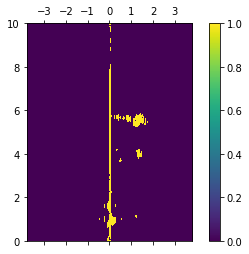

Image n. 64


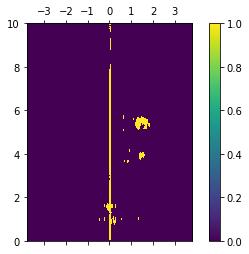

Image n. 65


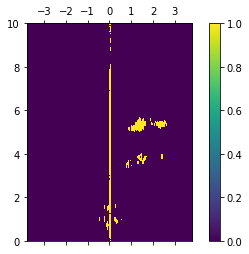

Image n. 66


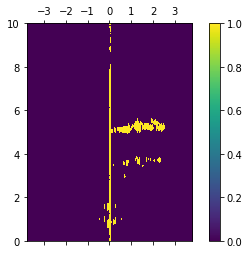

Image n. 67


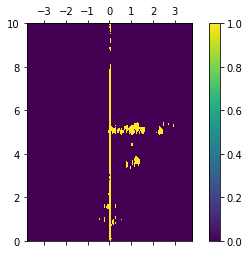

Image n. 68


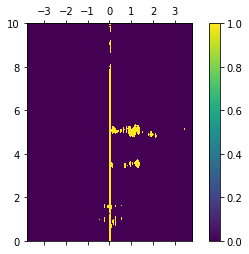

Image n. 69


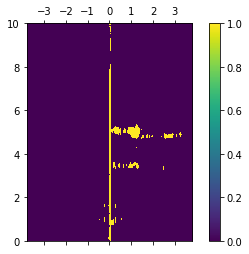

Image n. 70


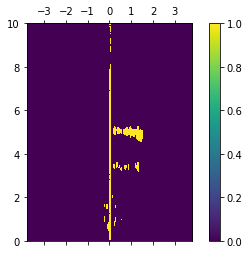

Image n. 71


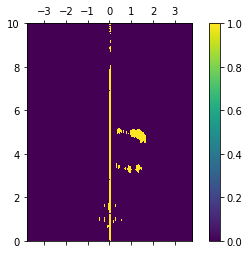

Image n. 72


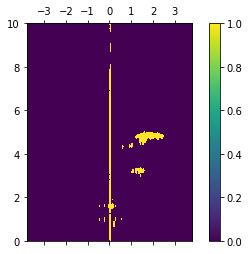

Image n. 73


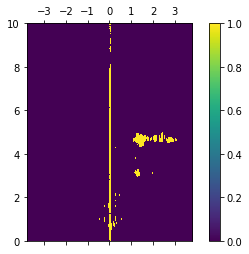

Image n. 74


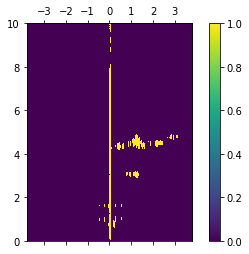

Image n. 75


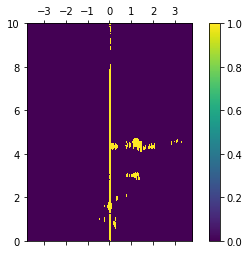

Image n. 76


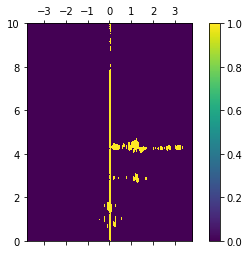

Image n. 77


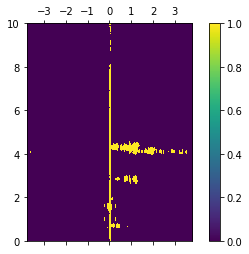

Image n. 78


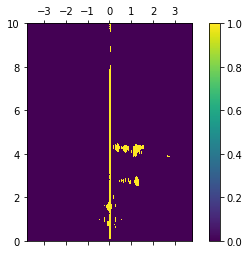

Image n. 79


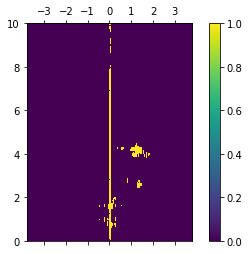

Image n. 80


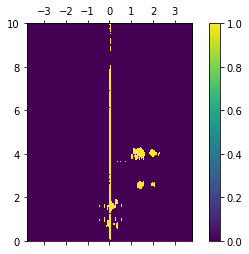

Image n. 81


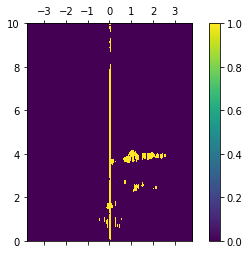

Image n. 82


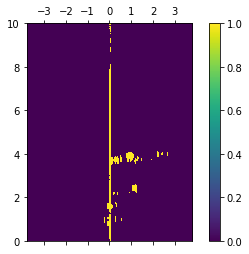

Image n. 83


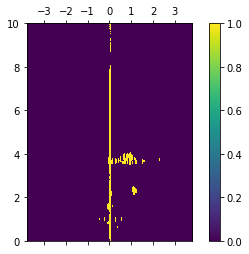

Image n. 84


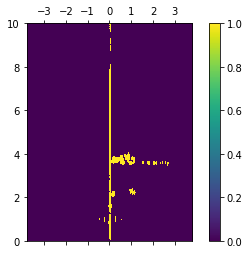

Image n. 85


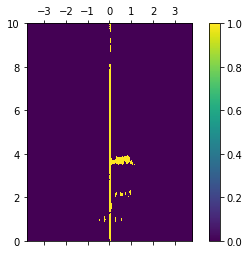

Image n. 86


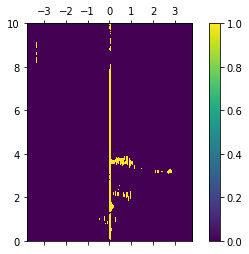

Image n. 87


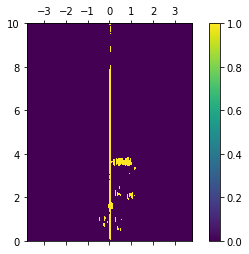

Image n. 88


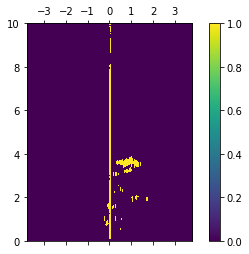

Image n. 89


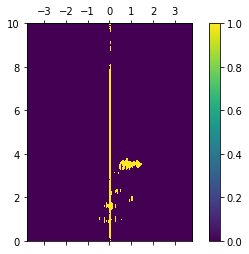

Image n. 90


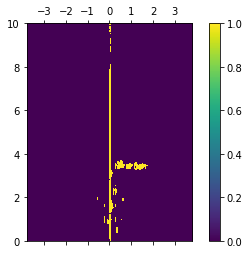

Image n. 91


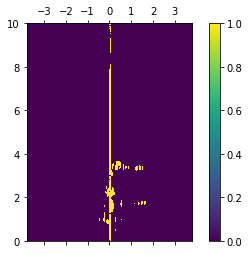

Image n. 92


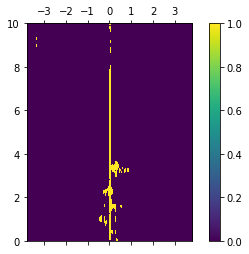

Image n. 93


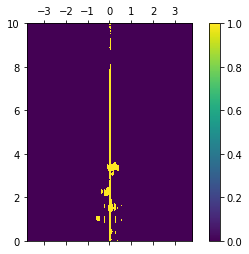

Image n. 94


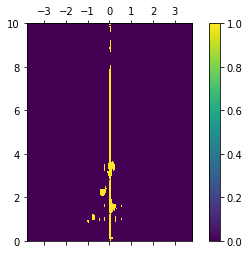

Image n. 95


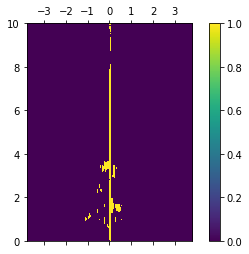

Image n. 96


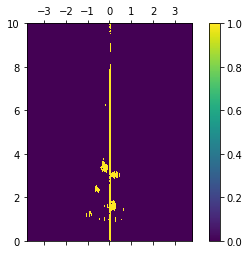

Image n. 97


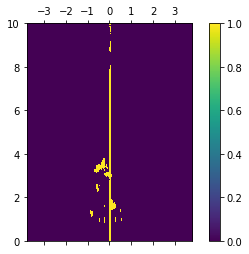

Image n. 98


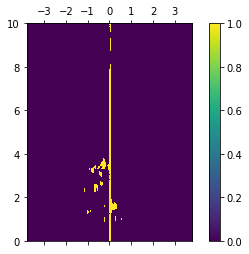

Image n. 99


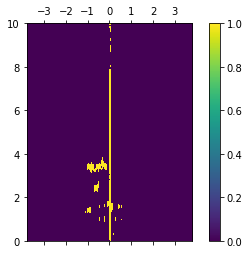

Image n. 100


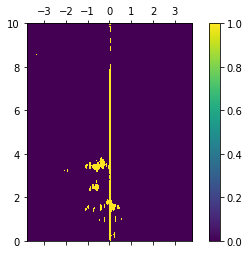

Image n. 101


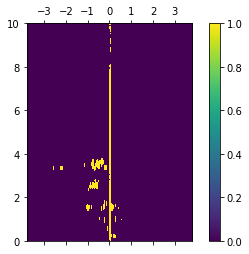

Image n. 102


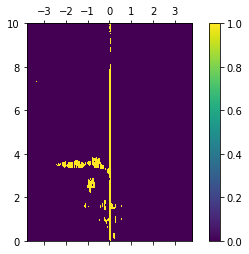

Image n. 103


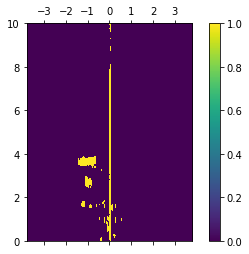

Image n. 104


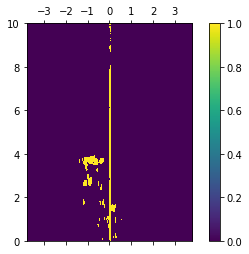

Image n. 105


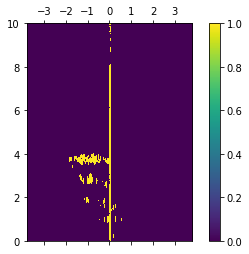

Image n. 106


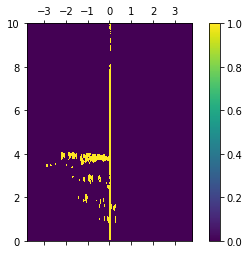

Image n. 107


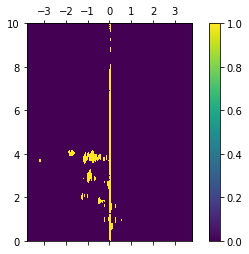

Image n. 108


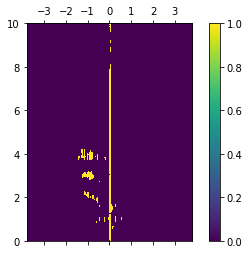

Image n. 109


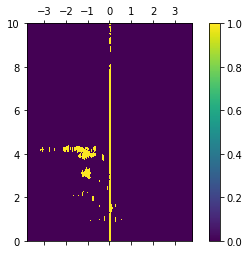

Image n. 110


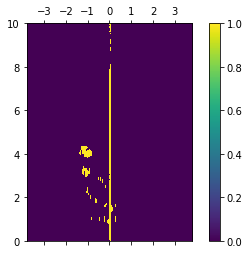

Image n. 111


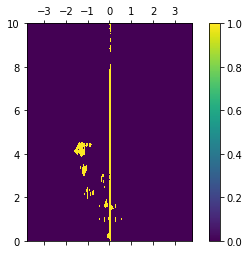

Image n. 112


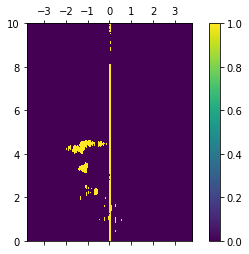

Image n. 113


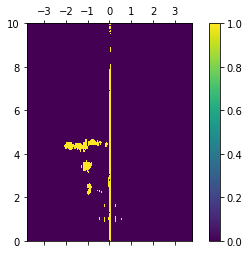

Image n. 114


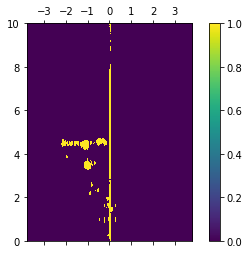

Image n. 115


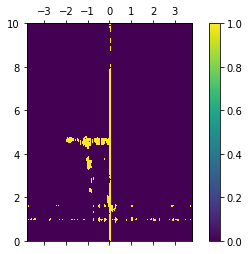

Image n. 116


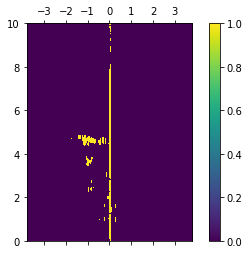

Image n. 117


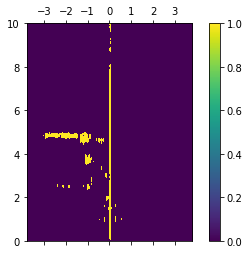

Image n. 118


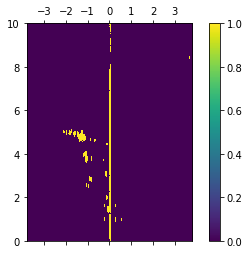

Image n. 119


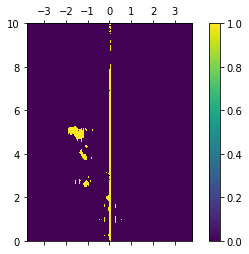

Image n. 120


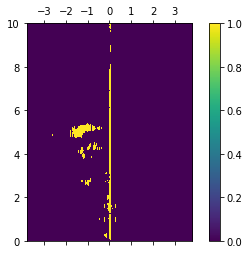

Image n. 121


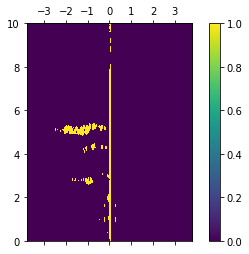

Image n. 122


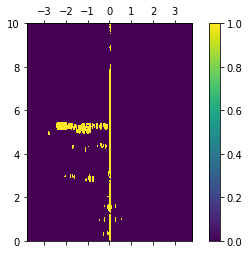

Image n. 123


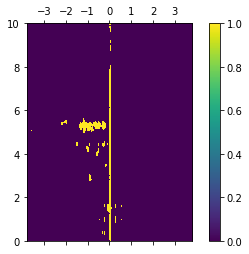

Image n. 124


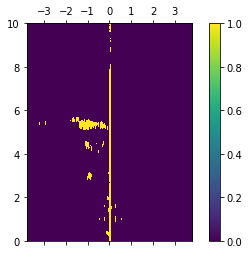

Image n. 125


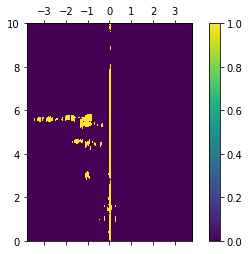

Image n. 126


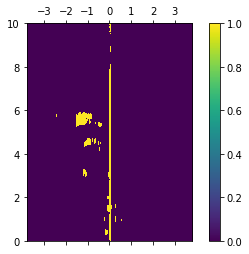

Image n. 127


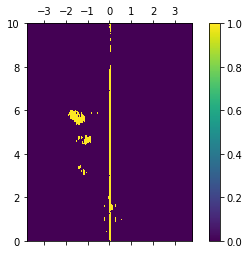

Image n. 128


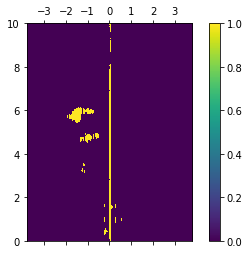

Image n. 129


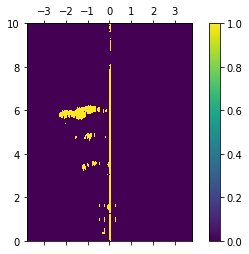

Image n. 130


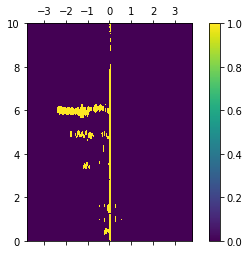

Image n. 131


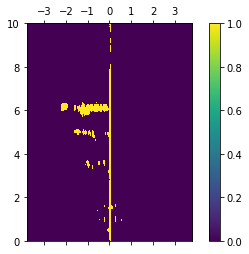

Image n. 132


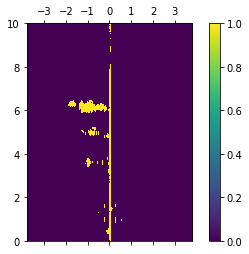

Image n. 133


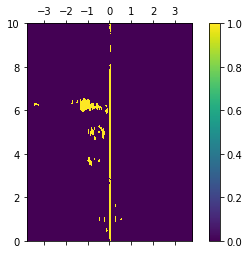

Image n. 134


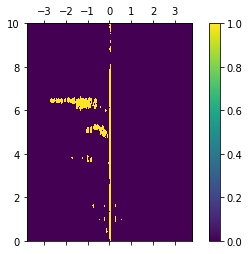

Image n. 135


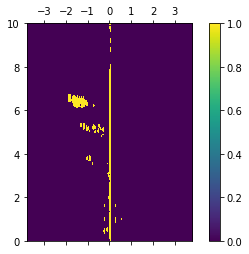

Image n. 136


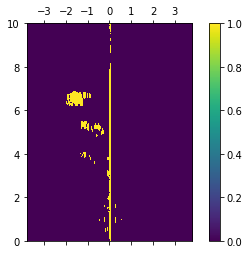

Image n. 137


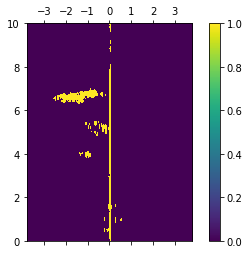

Image n. 138


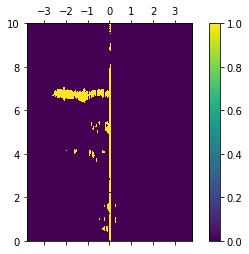

Image n. 139


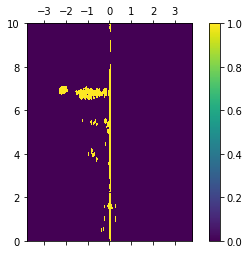

Image n. 140


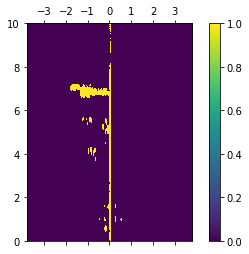

Image n. 141


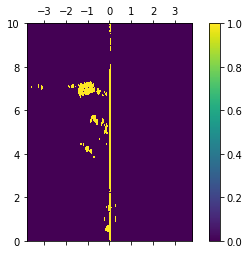

Image n. 142


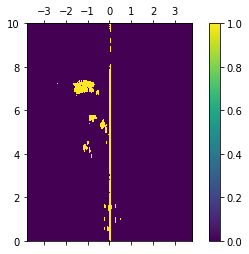

Image n. 143


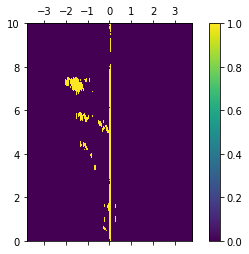

Image n. 144


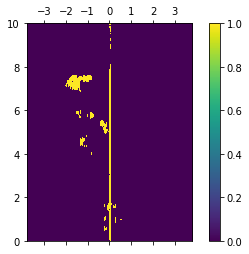

Image n. 145


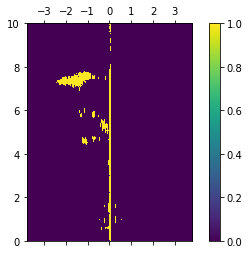

Image n. 146


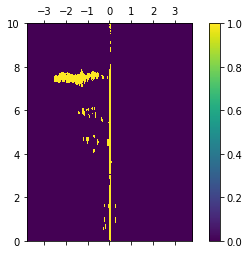

Image n. 147


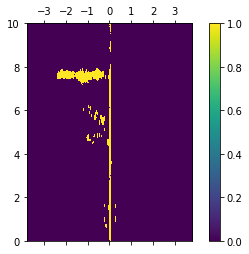

Image n. 148


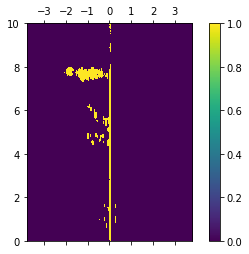

Image n. 149


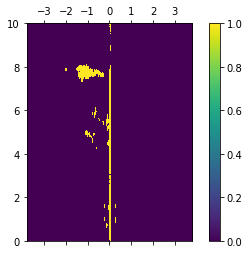

Image n. 150


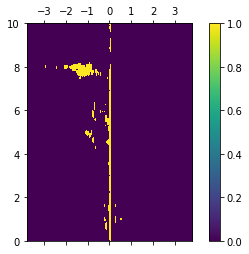

Image n. 151


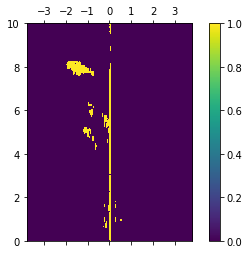

Image n. 152


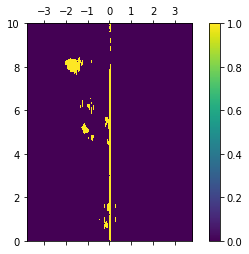

Image n. 153


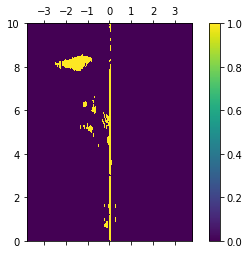

Image n. 154


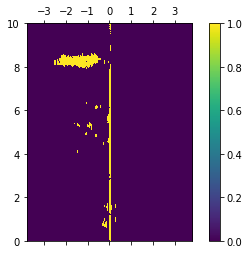

Image n. 155


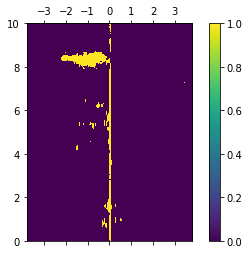

Image n. 156


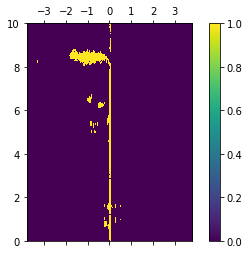

Image n. 157


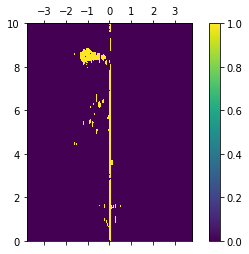

Image n. 158


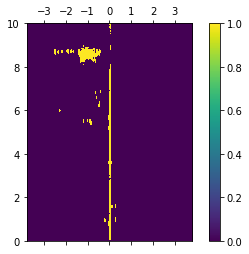

Image n. 159


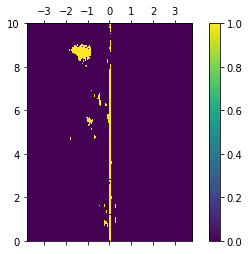

Image n. 160


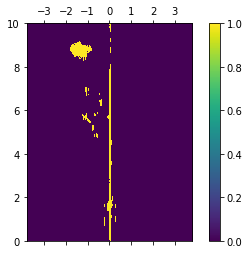

Image n. 161


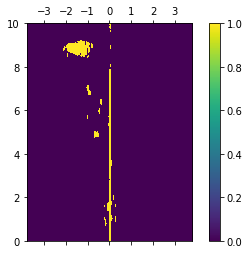

Image n. 162


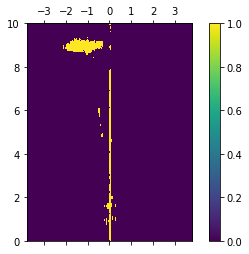

Image n. 163


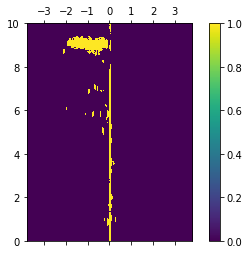

Image n. 164


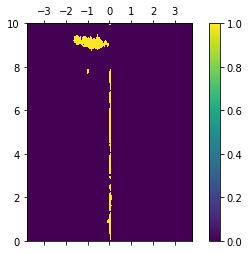

Image n. 165


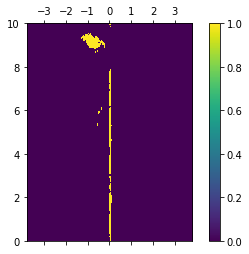

Image n. 166


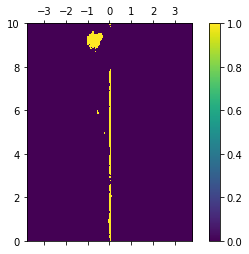

Image n. 167


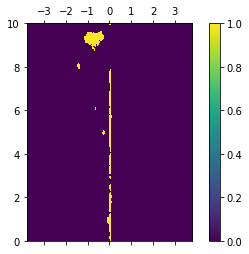

Image n. 168


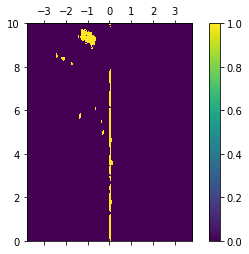

Image n. 169


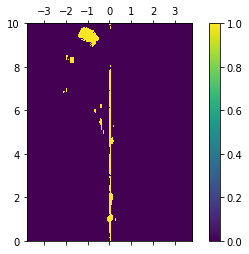

Image n. 170


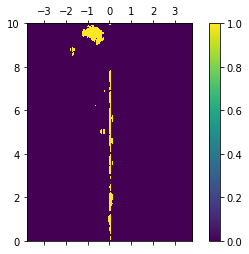

Image n. 171


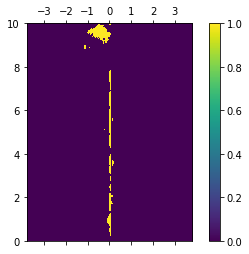

Image n. 172


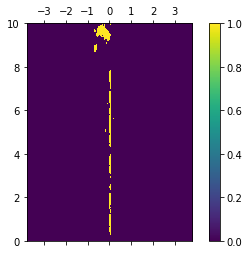

Image n. 173


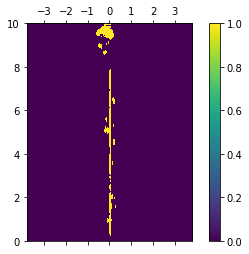

Image n. 174


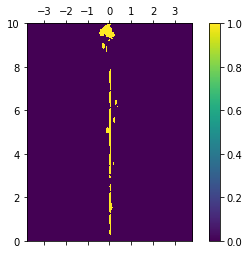

Image n. 175


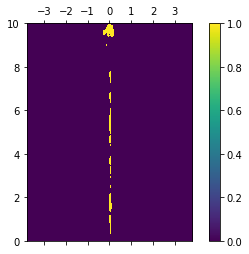

Image n. 176


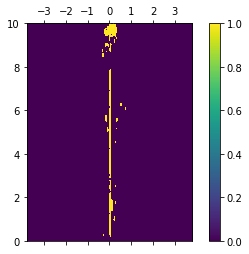

Image n. 177


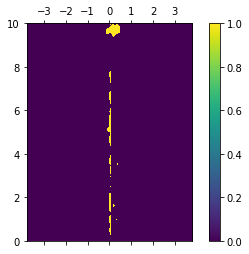

Image n. 178


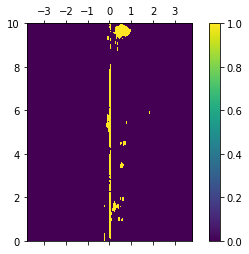

In [63]:
rda_thresh_d = np.empty((n_frame, dim[0], dim[1]))

for j in range(n_frame):
    t = np.zeros((100, 1))
    for i in range(100):
        t[i] = (X>-100+i).sum()
    min_val = np.argmin(np.abs(t - 2000), axis=0)
    t_min = -100 + min_val

    rda_thresh_d[j,:,:] = (rda[j]>t_min)*1
    print('Image n.',j)

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax = ax.matshow(rda_thresh_d[j,:,:], extent=[-3.8,3.8,0,10])
    fig.colorbar(ax)
    plt.show()


### Second method

0.0009071826934814453
-42.25250031107892


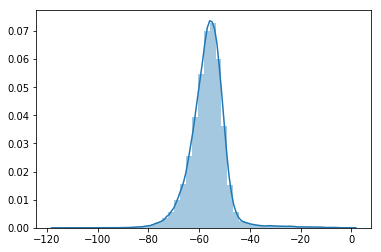

In [60]:
sns.distplot(X.flatten())
#scipy.stats.shapiro(X.flatten())
start = time.time()
m = np.mean(X.flatten()) + 2*np.std(X.flatten())
end = time.time()
print(end - start)
print(m)

Image n. 0


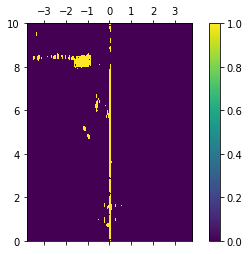

Image n. 1


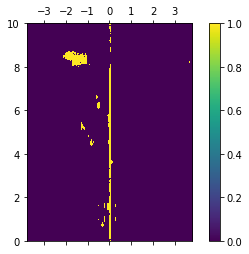

Image n. 2


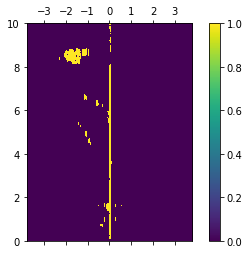

Image n. 3


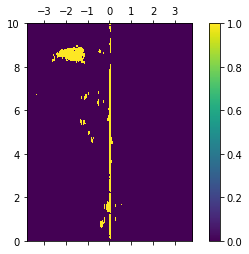

Image n. 4


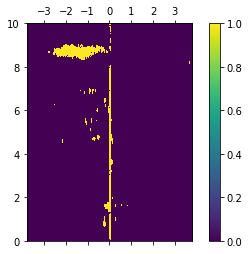

Image n. 5


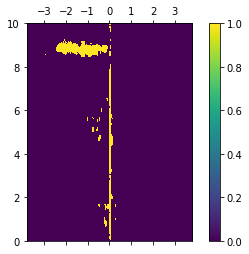

Image n. 6


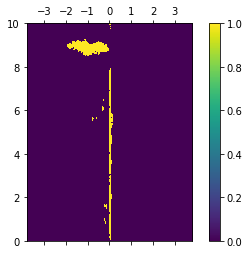

Image n. 7


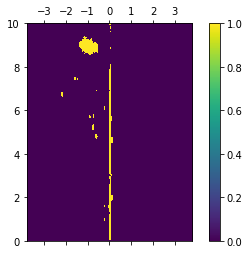

Image n. 8


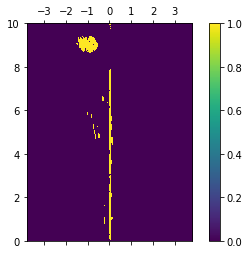

Image n. 9


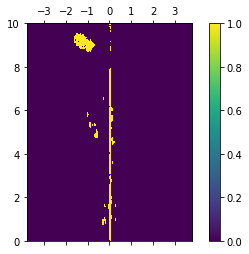

Image n. 10


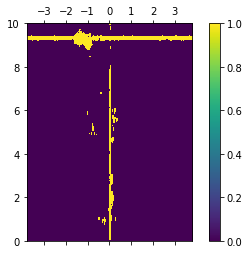

Image n. 11


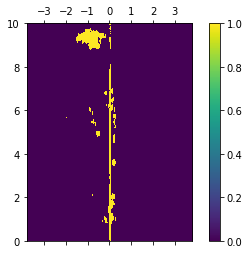

Image n. 12


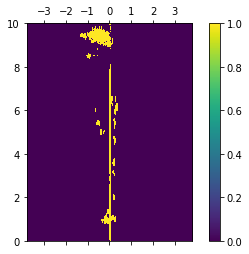

Image n. 13


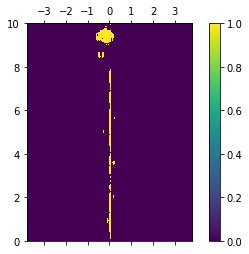

Image n. 14


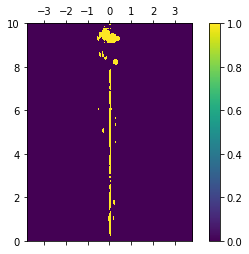

Image n. 15


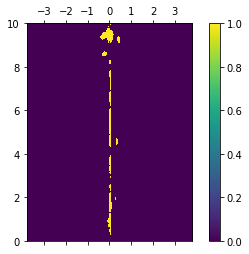

Image n. 16


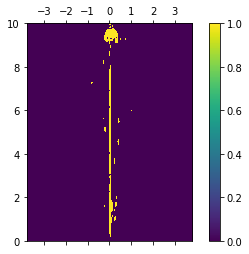

Image n. 17


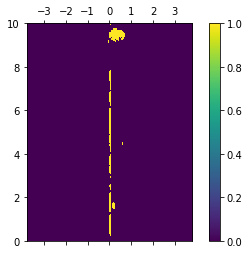

Image n. 18


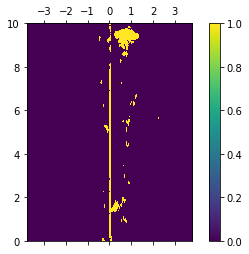

Image n. 19


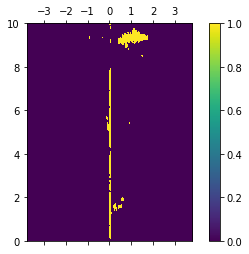

Image n. 20


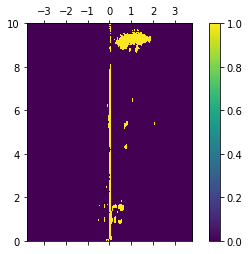

Image n. 21


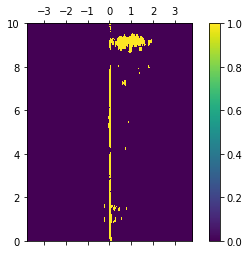

Image n. 22


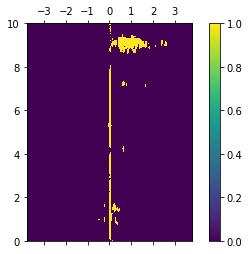

Image n. 23


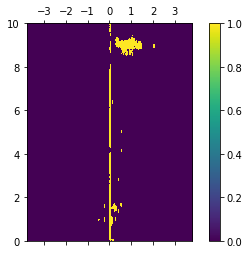

Image n. 24


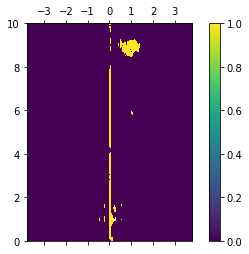

Image n. 25


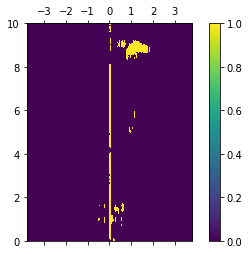

Image n. 26


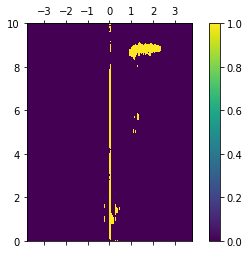

Image n. 27


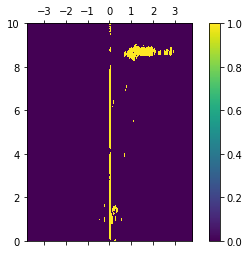

Image n. 28


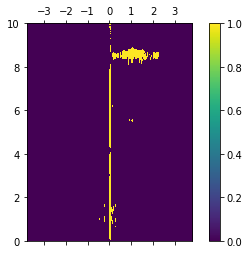

Image n. 29


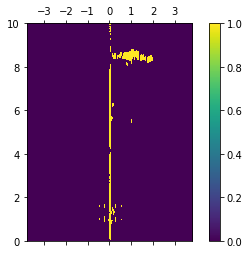

Image n. 30


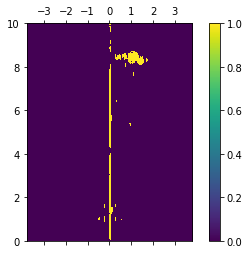

Image n. 31


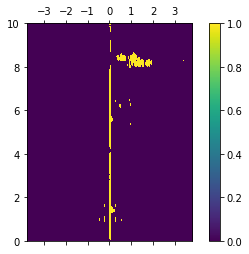

Image n. 32


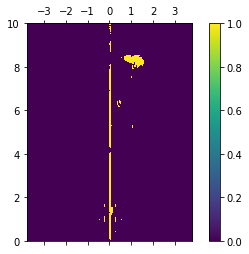

Image n. 33


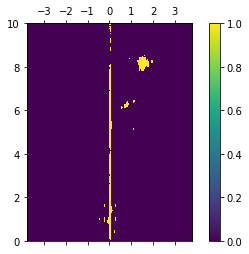

Image n. 34


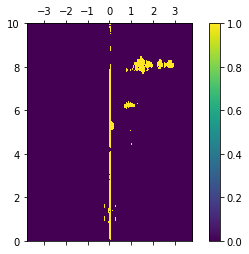

Image n. 35


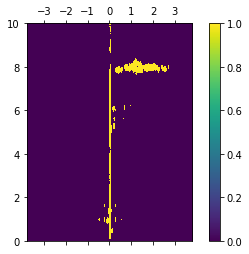

Image n. 36


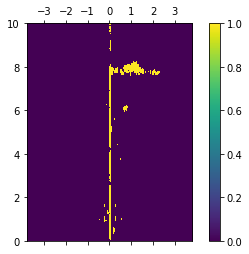

Image n. 37


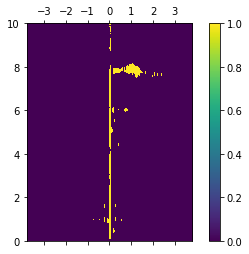

Image n. 38


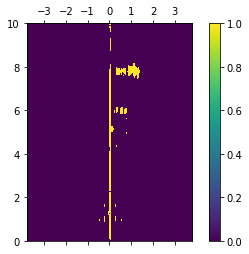

Image n. 39


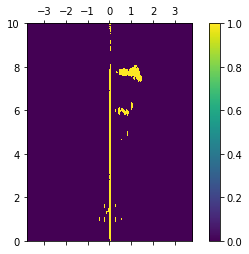

Image n. 40


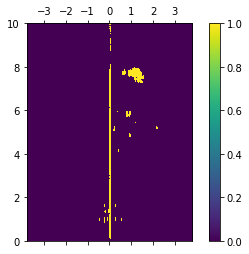

Image n. 41


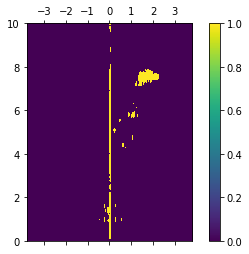

Image n. 42


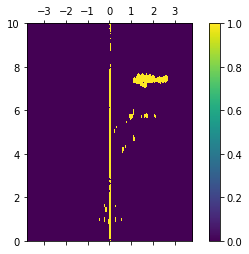

Image n. 43


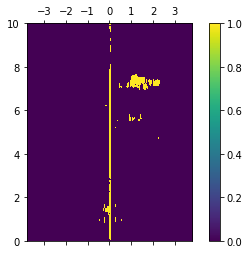

Image n. 44


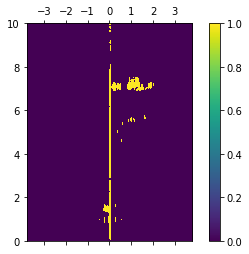

Image n. 45


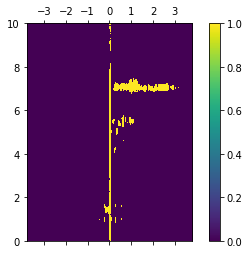

Image n. 46


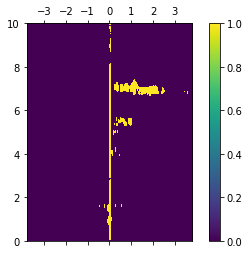

Image n. 47


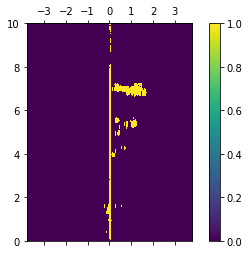

Image n. 48


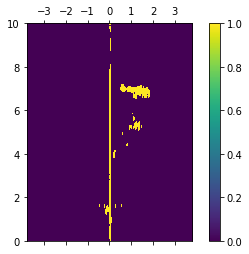

Image n. 49


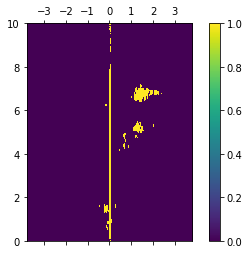

Image n. 50


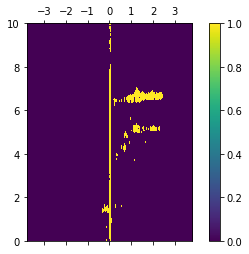

Image n. 51


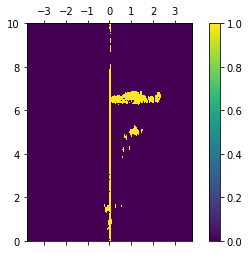

Image n. 52


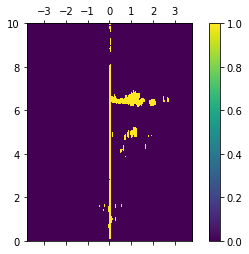

Image n. 53


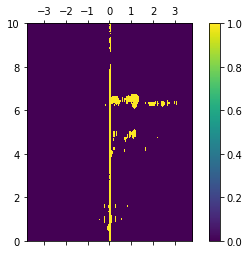

Image n. 54


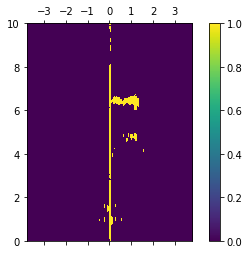

Image n. 55


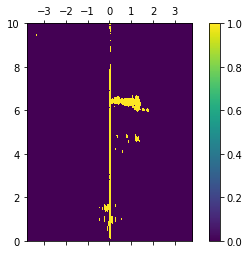

Image n. 56


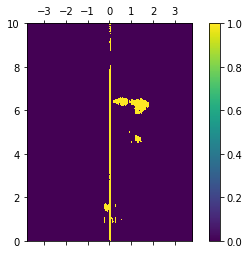

Image n. 57


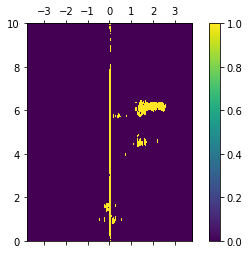

Image n. 58


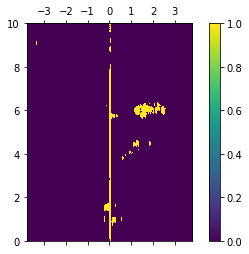

Image n. 59


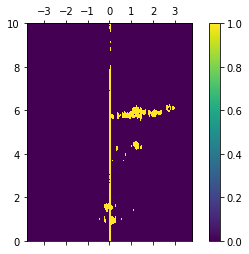

Image n. 60


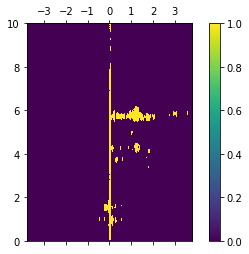

Image n. 61


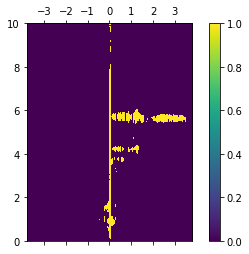

Image n. 62


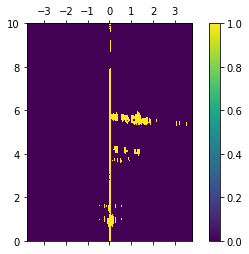

Image n. 63


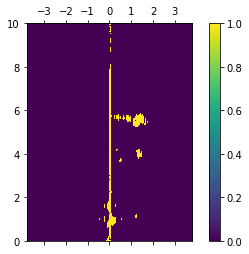

Image n. 64


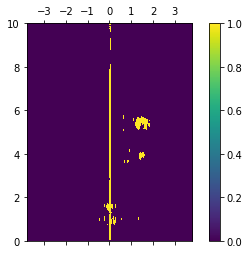

Image n. 65


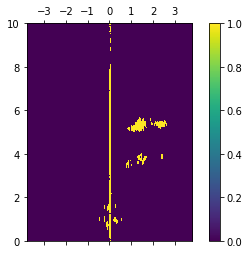

Image n. 66


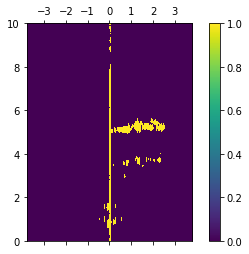

Image n. 67


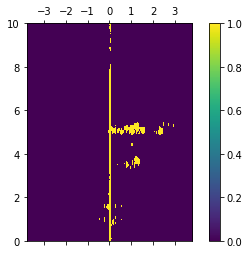

Image n. 68


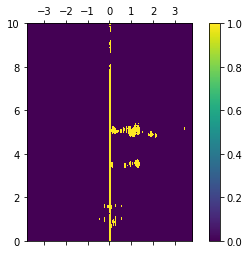

Image n. 69


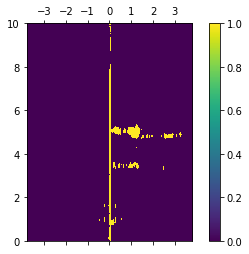

Image n. 70


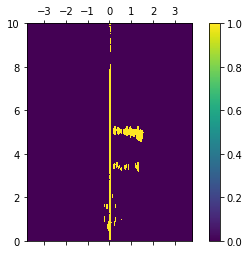

Image n. 71


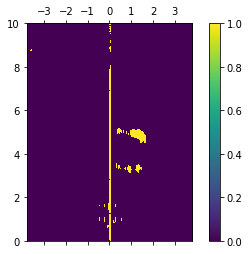

Image n. 72


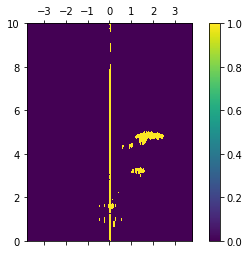

Image n. 73


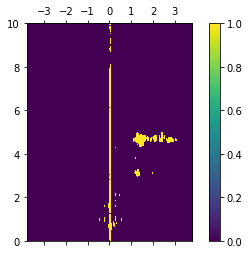

Image n. 74


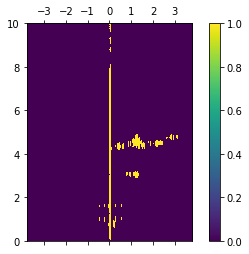

Image n. 75


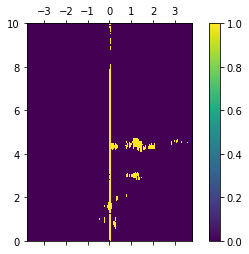

Image n. 76


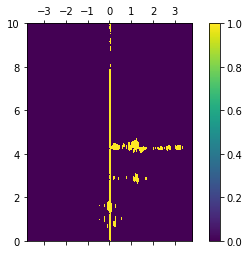

Image n. 77


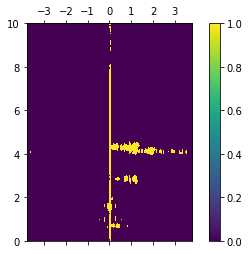

Image n. 78


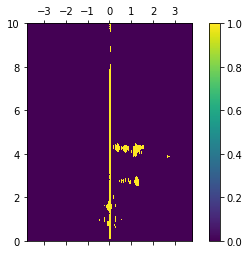

Image n. 79


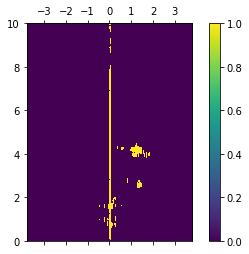

Image n. 80


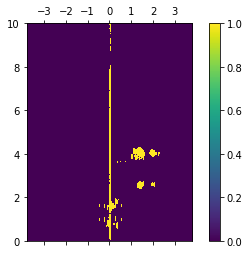

Image n. 81


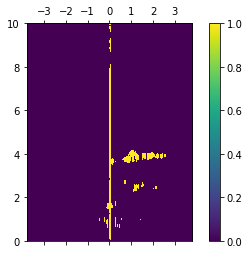

Image n. 82


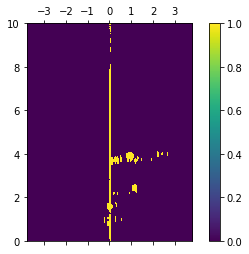

Image n. 83


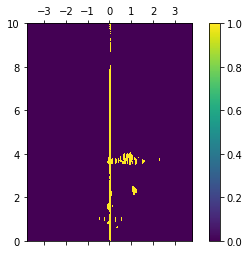

Image n. 84


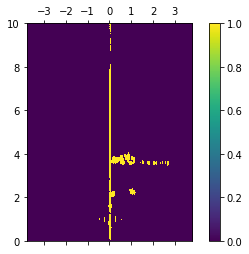

Image n. 85


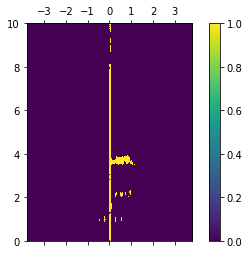

Image n. 86


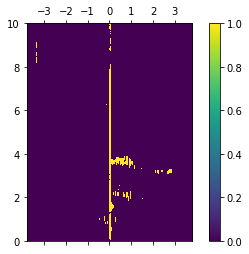

Image n. 87


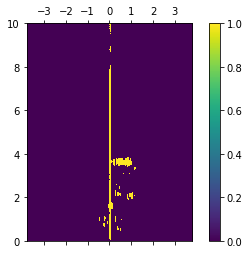

Image n. 88


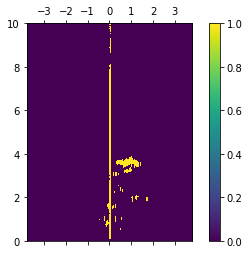

Image n. 89


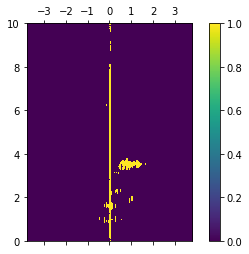

Image n. 90


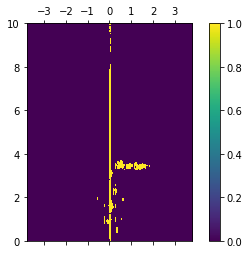

Image n. 91


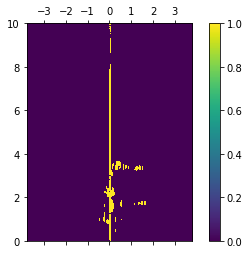

Image n. 92


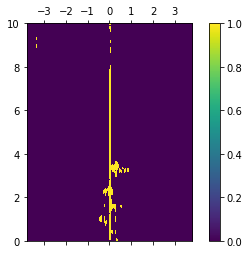

Image n. 93


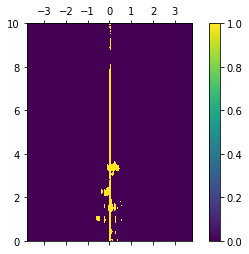

Image n. 94


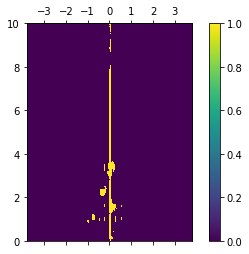

Image n. 95


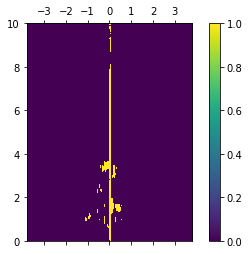

Image n. 96


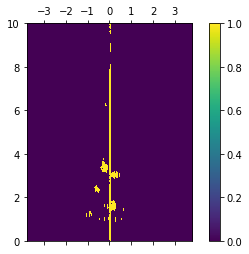

Image n. 97


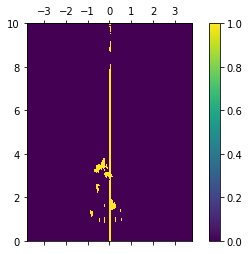

Image n. 98


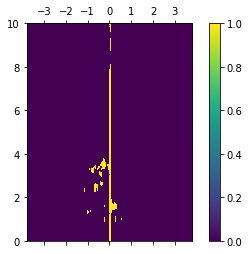

Image n. 99


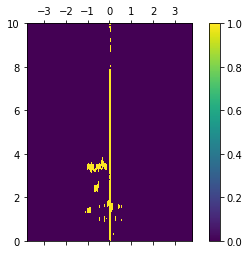

Image n. 100


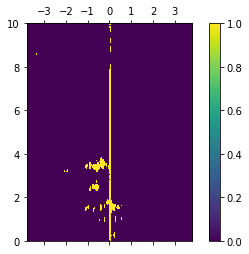

Image n. 101


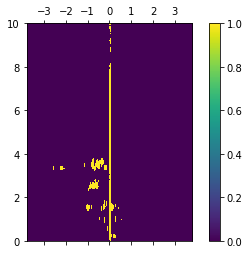

Image n. 102


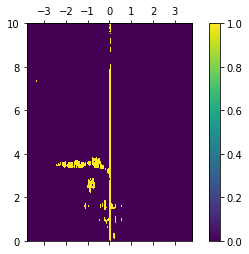

Image n. 103


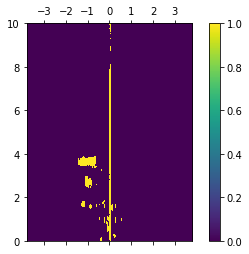

Image n. 104


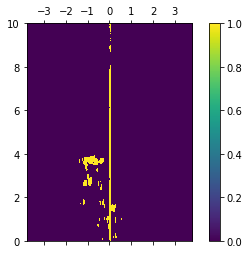

Image n. 105


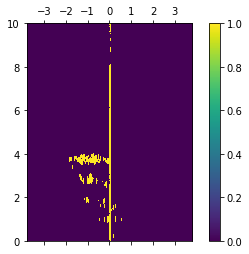

Image n. 106


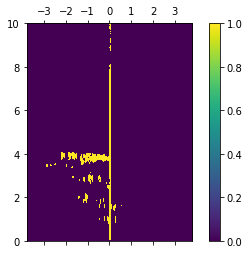

Image n. 107


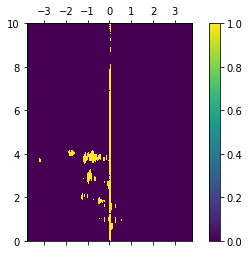

Image n. 108


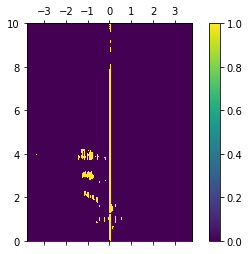

Image n. 109


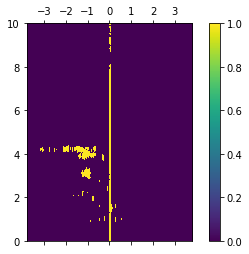

Image n. 110


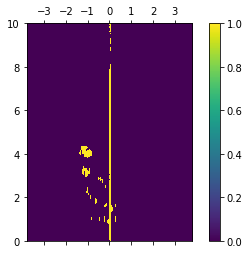

Image n. 111


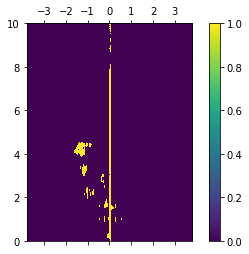

Image n. 112


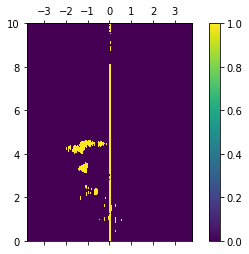

Image n. 113


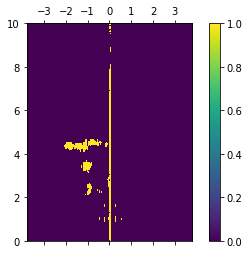

Image n. 114


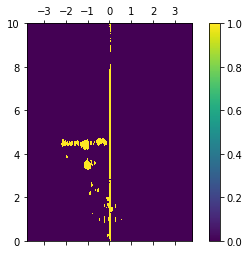

Image n. 115


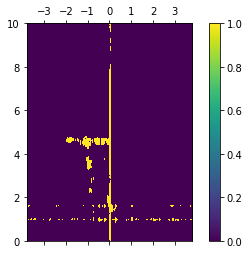

Image n. 116


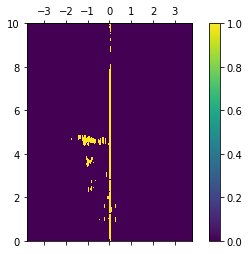

Image n. 117


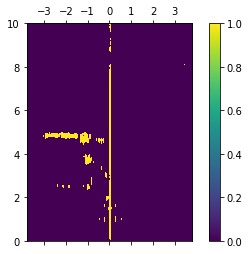

Image n. 118


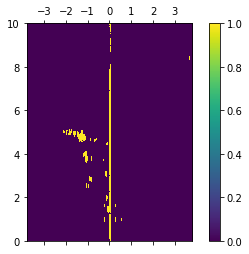

Image n. 119


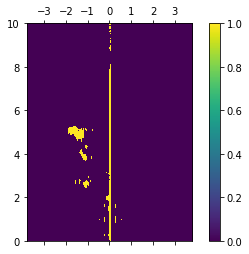

Image n. 120


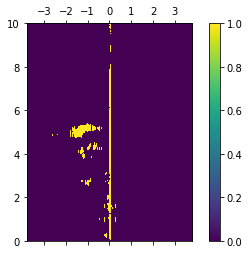

Image n. 121


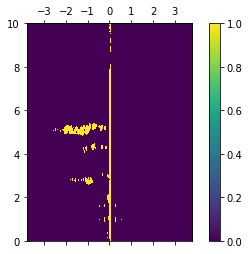

Image n. 122


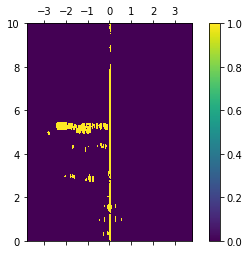

Image n. 123


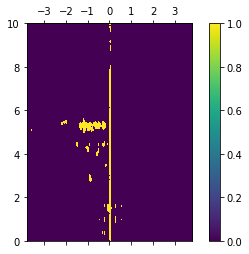

Image n. 124


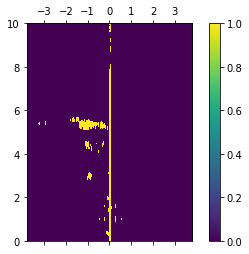

Image n. 125


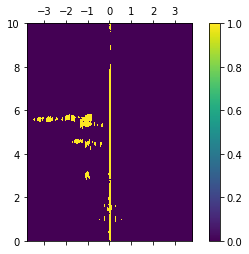

Image n. 126


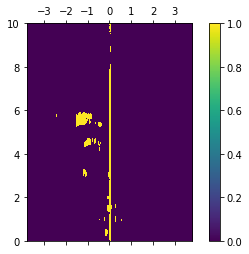

Image n. 127


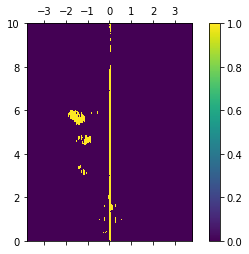

Image n. 128


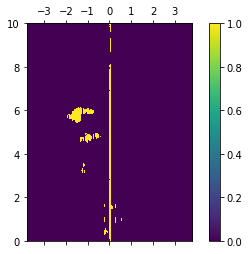

Image n. 129


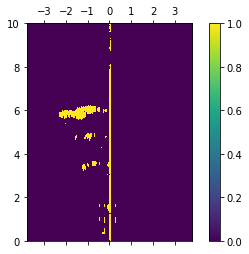

Image n. 130


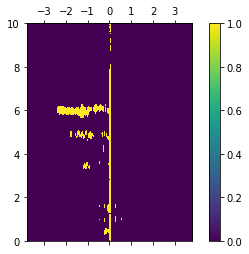

Image n. 131


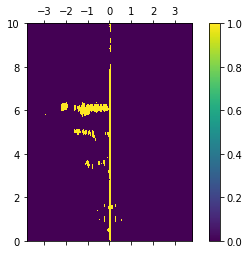

Image n. 132


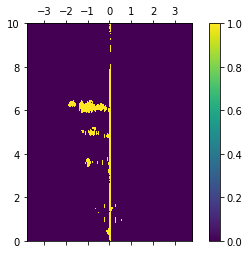

Image n. 133


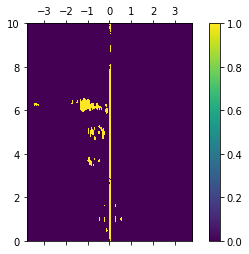

Image n. 134


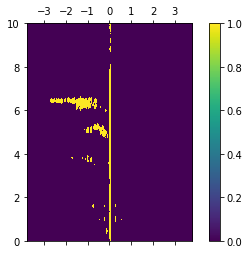

Image n. 135


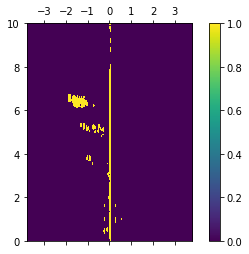

Image n. 136


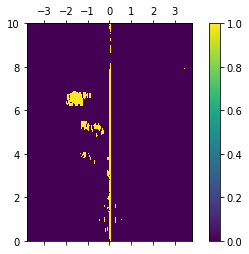

Image n. 137


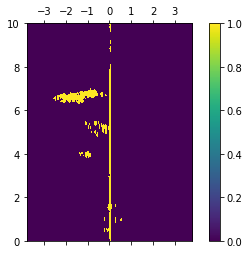

Image n. 138


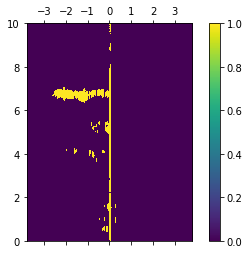

Image n. 139


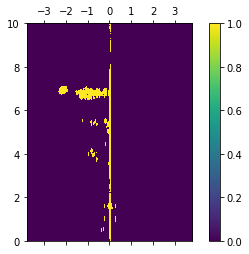

Image n. 140


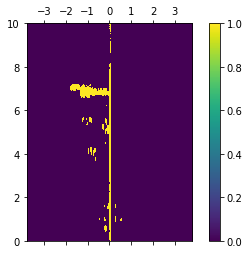

Image n. 141


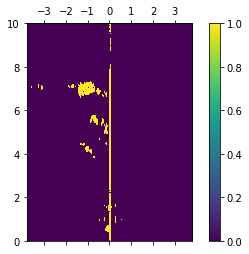

Image n. 142


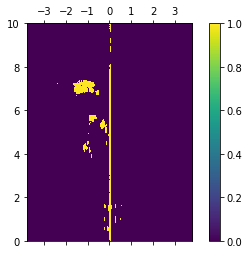

Image n. 143


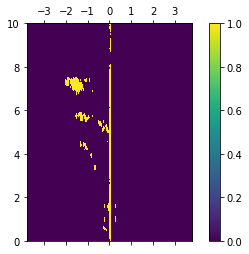

Image n. 144


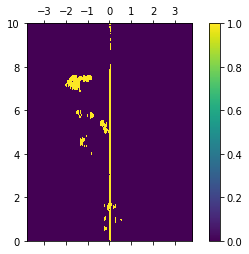

Image n. 145


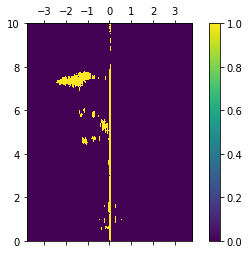

Image n. 146


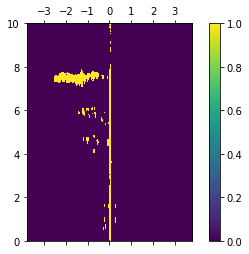

Image n. 147


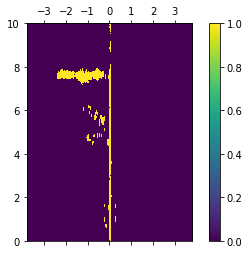

Image n. 148


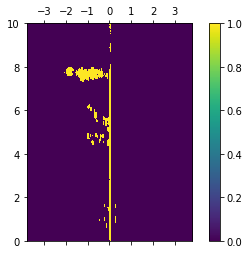

Image n. 149


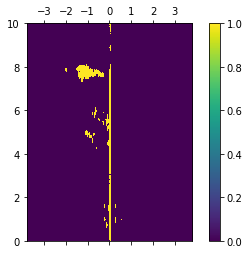

Image n. 150


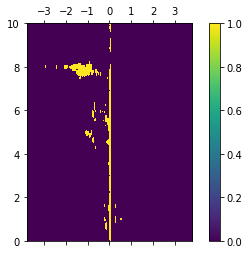

Image n. 151


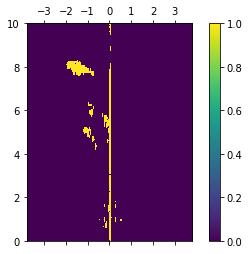

Image n. 152


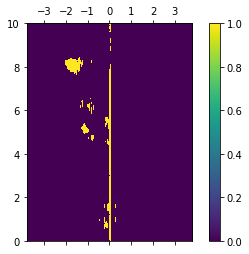

Image n. 153


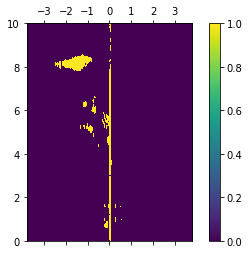

Image n. 154


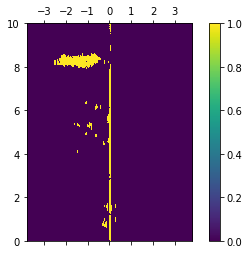

Image n. 155


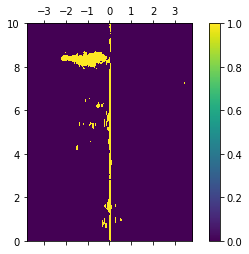

Image n. 156


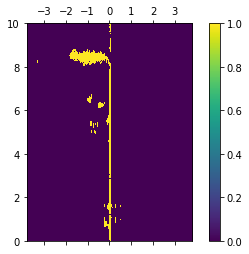

Image n. 157


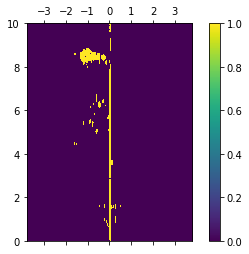

Image n. 158


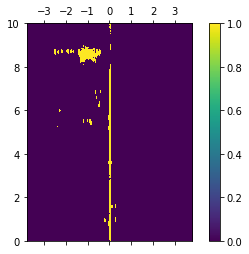

Image n. 159


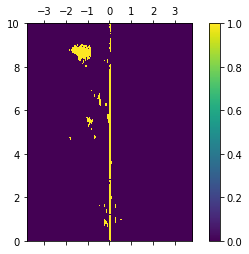

Image n. 160


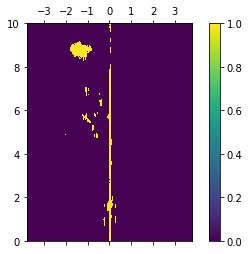

Image n. 161


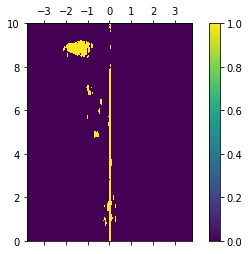

Image n. 162


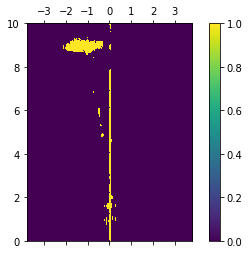

Image n. 163


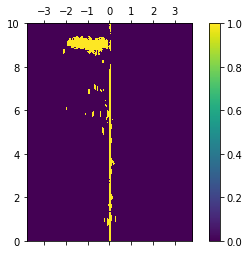

Image n. 164


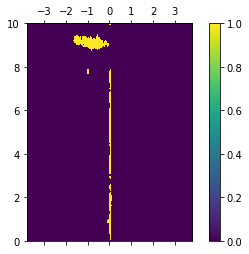

Image n. 165


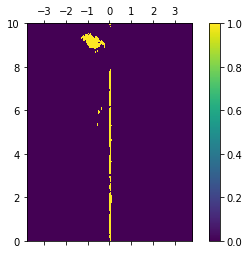

Image n. 166


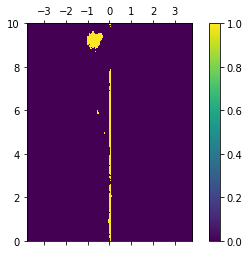

Image n. 167


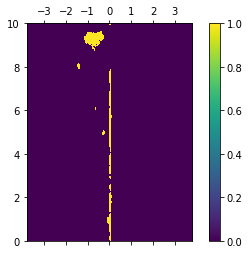

Image n. 168


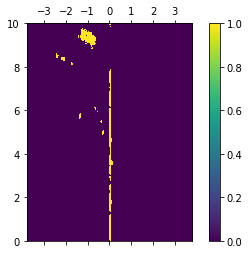

Image n. 169


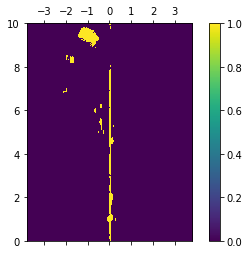

Image n. 170


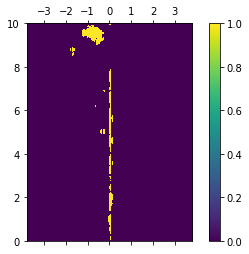

Image n. 171


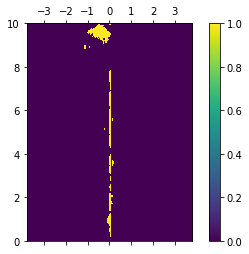

Image n. 172


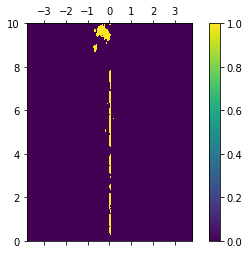

Image n. 173


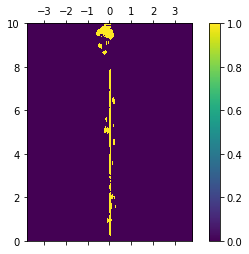

Image n. 174


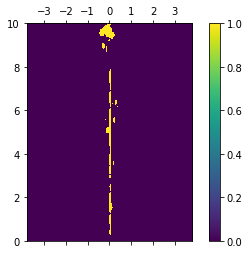

Image n. 175


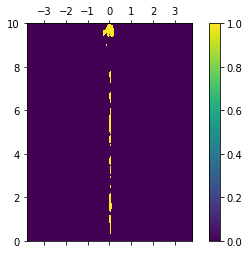

Image n. 176


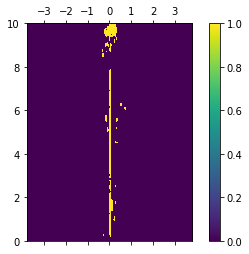

Image n. 177


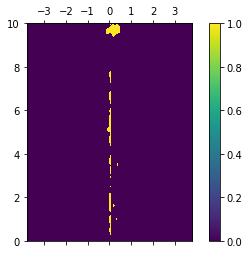

Image n. 178


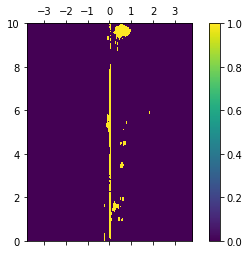

In [64]:
rda_thresh_g = np.empty((n_frame, dim[0], dim[1]))

for i in range(n_frame):
    m = np.mean(X.flatten()) + 2*np.std(X.flatten())
    rda_thresh_g[i, :, :] = (rda[i]>m)*1
    print('Image n.',i)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(rda_thresh_g[i], extent=[-3.8,3.8,0,10])
    fig.colorbar(cax)
    plt.show()

## Additional tweaks
The vertical central line has been removed from all the frames.

Image n. 0


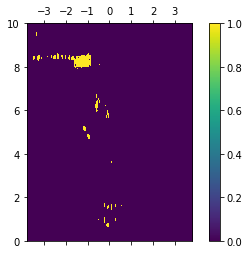

Image n. 1


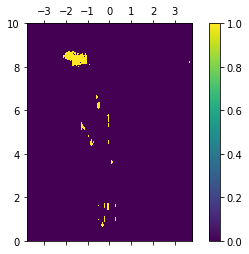

Image n. 2


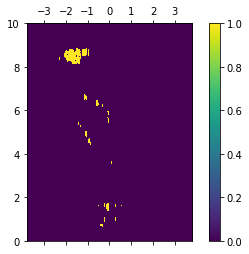

Image n. 3


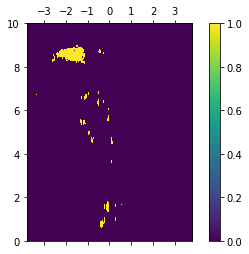

Image n. 4


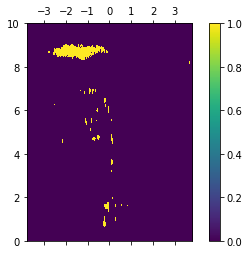

Image n. 5


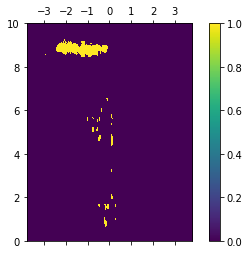

Image n. 6


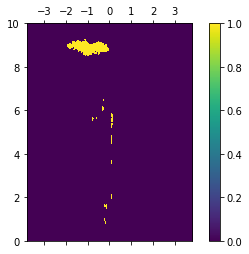

Image n. 7


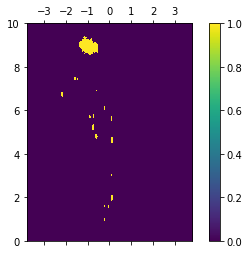

Image n. 8


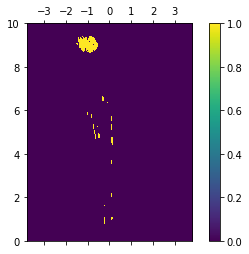

Image n. 9


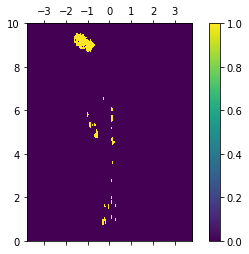

Image n. 10


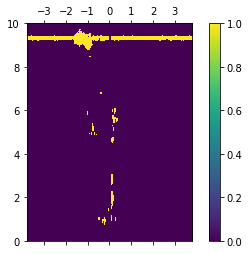

Image n. 11


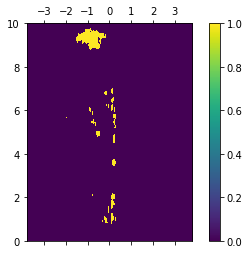

Image n. 12


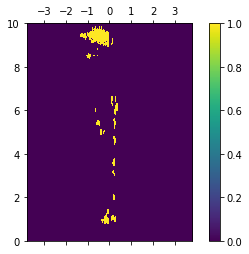

Image n. 13


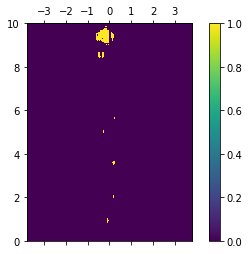

Image n. 14


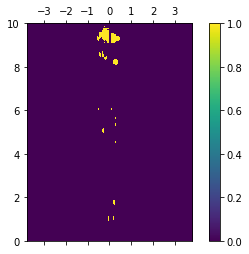

Image n. 15


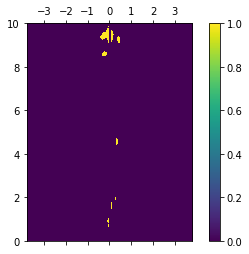

Image n. 16


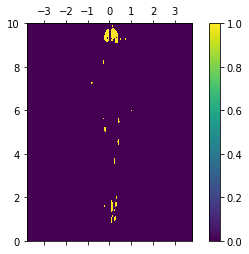

Image n. 17


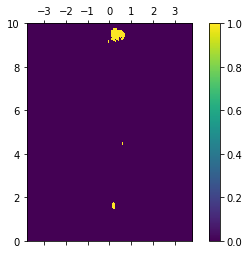

Image n. 18


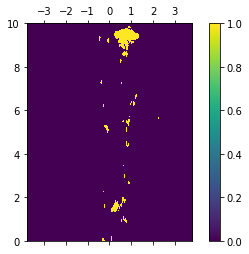

Image n. 19


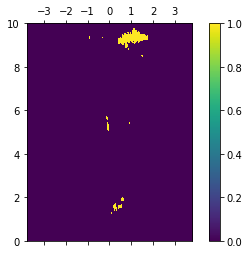

Image n. 20


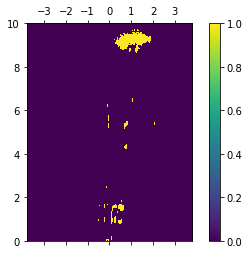

Image n. 21


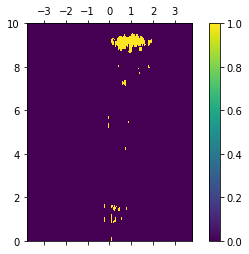

Image n. 22


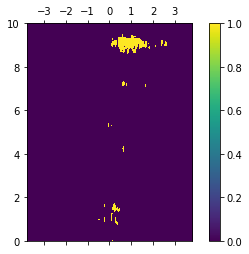

Image n. 23


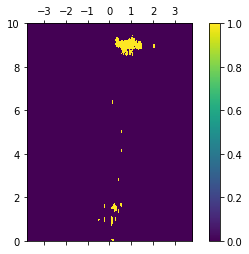

Image n. 24


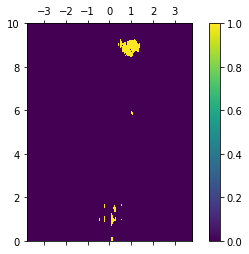

Image n. 25


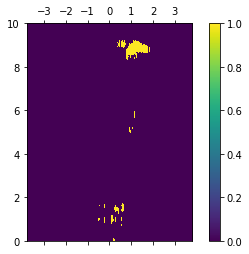

Image n. 26


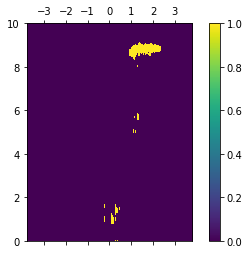

Image n. 27


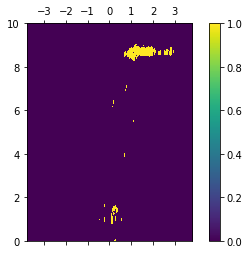

Image n. 28


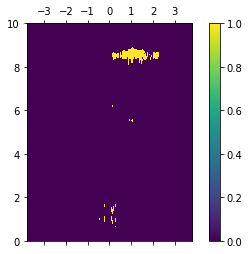

Image n. 29


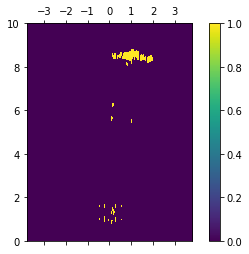

Image n. 30


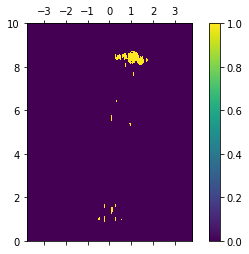

Image n. 31


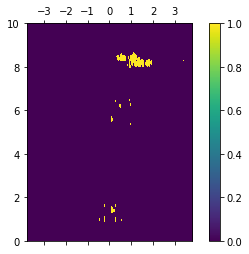

Image n. 32


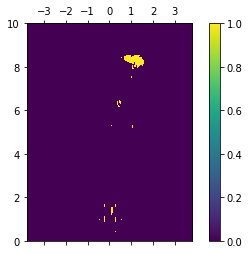

Image n. 33


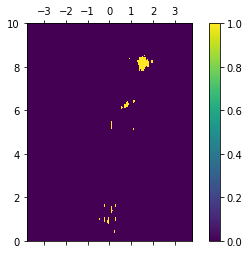

Image n. 34


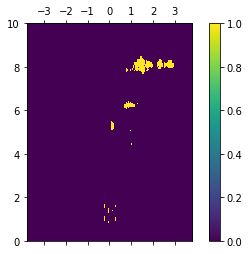

Image n. 35


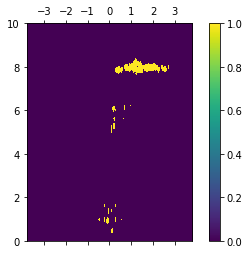

Image n. 36


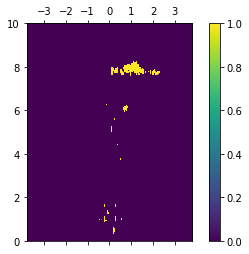

Image n. 37


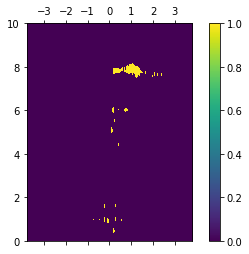

Image n. 38


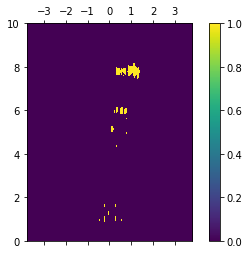

Image n. 39


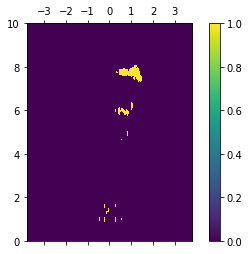

Image n. 40


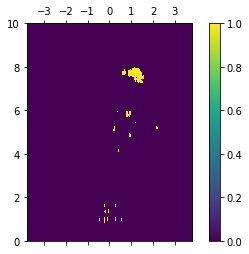

Image n. 41


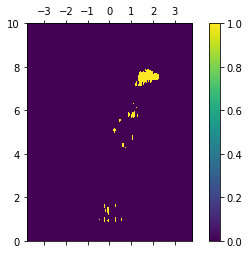

Image n. 42


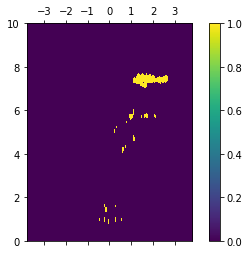

Image n. 43


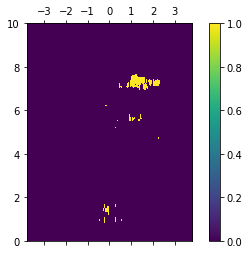

Image n. 44


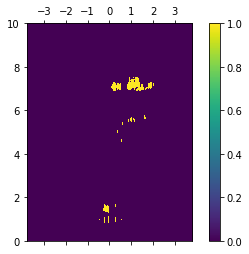

Image n. 45


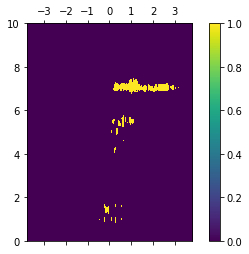

Image n. 46


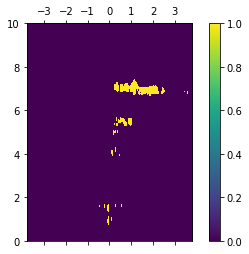

Image n. 47


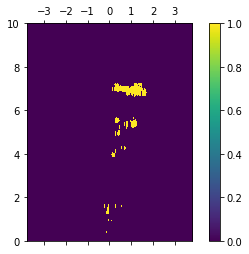

Image n. 48


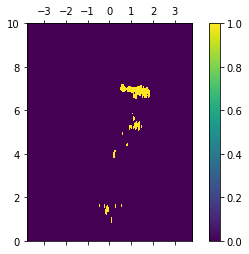

Image n. 49


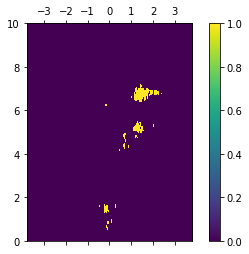

Image n. 50


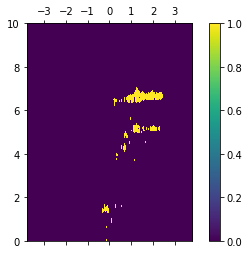

Image n. 51


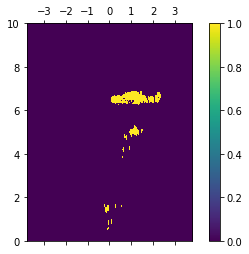

Image n. 52


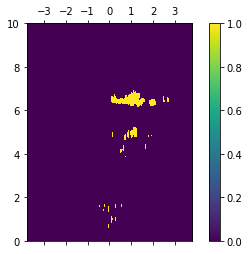

Image n. 53


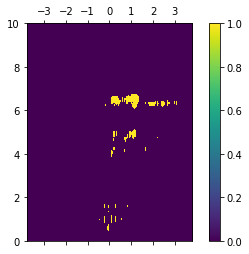

Image n. 54


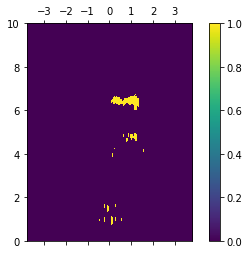

Image n. 55


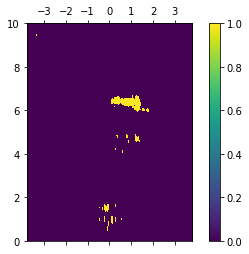

Image n. 56


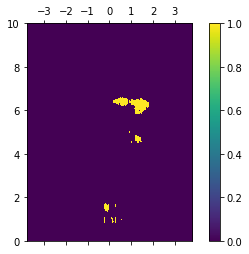

Image n. 57


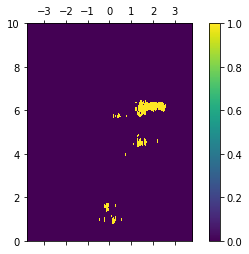

Image n. 58


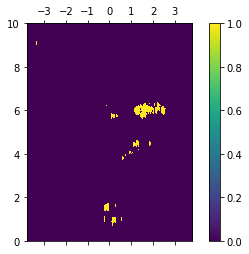

Image n. 59


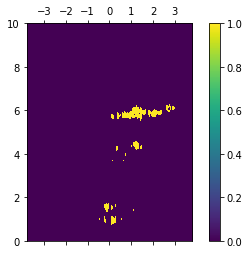

Image n. 60


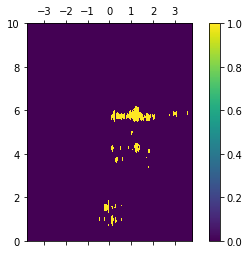

Image n. 61


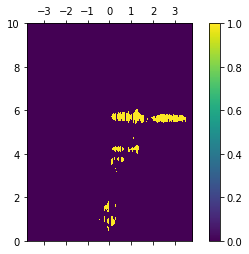

Image n. 62


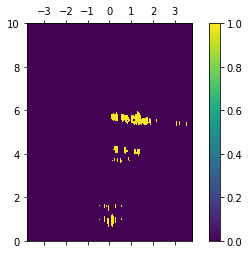

Image n. 63


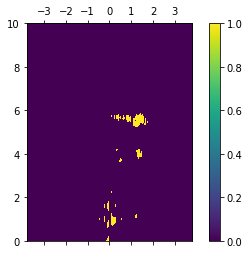

Image n. 64


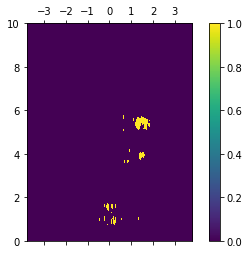

Image n. 65


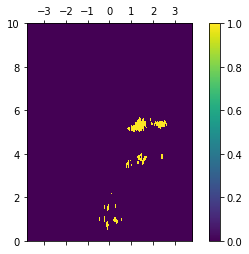

Image n. 66


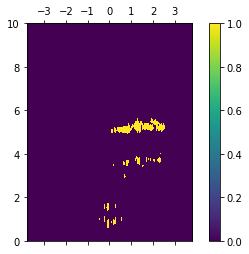

Image n. 67


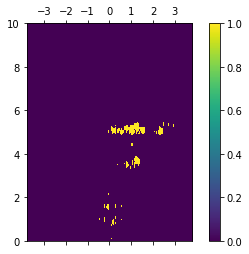

Image n. 68


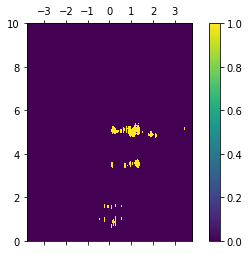

Image n. 69


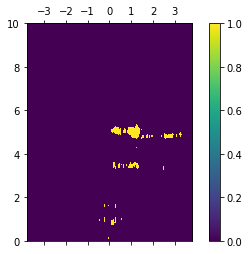

Image n. 70


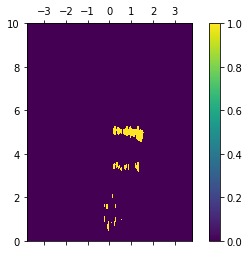

Image n. 71


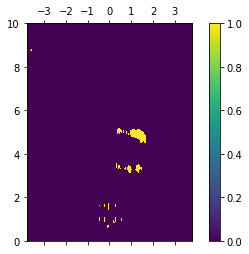

Image n. 72


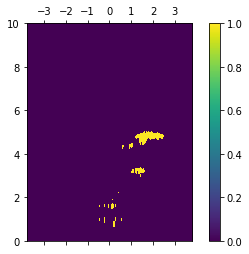

Image n. 73


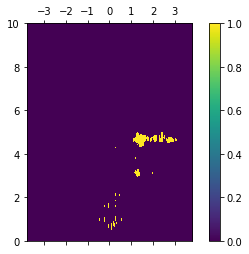

Image n. 74


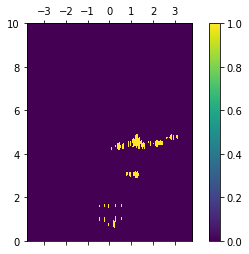

Image n. 75


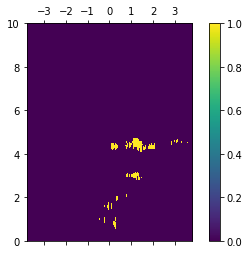

Image n. 76


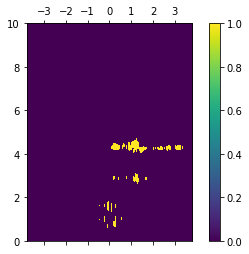

Image n. 77


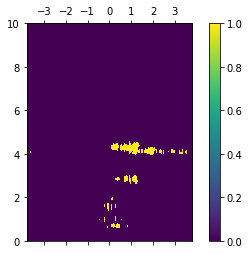

Image n. 78


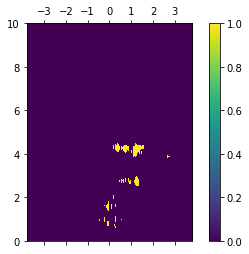

Image n. 79


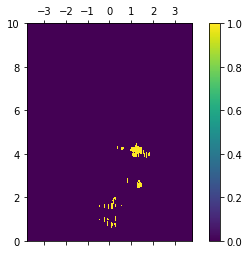

Image n. 80


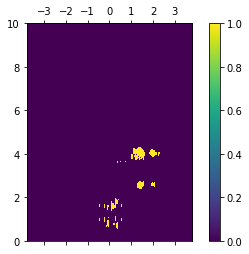

Image n. 81


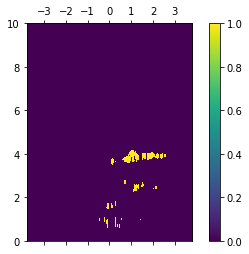

Image n. 82


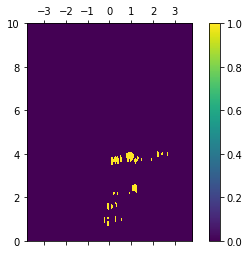

Image n. 83


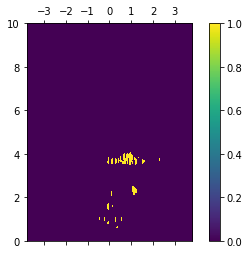

Image n. 84


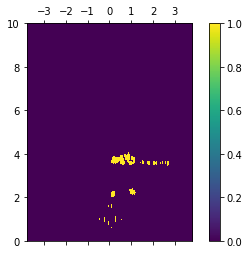

Image n. 85


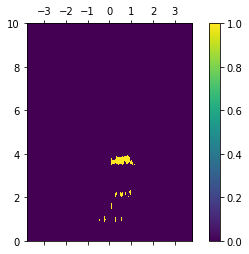

Image n. 86


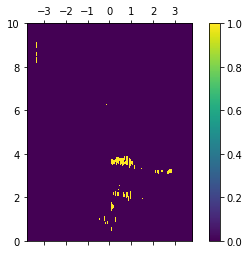

Image n. 87


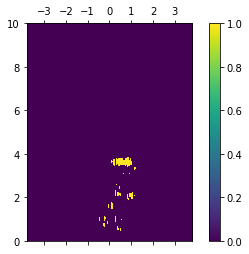

Image n. 88


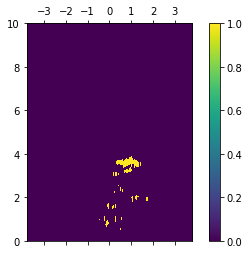

Image n. 89


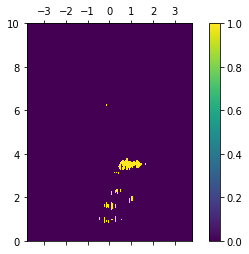

Image n. 90


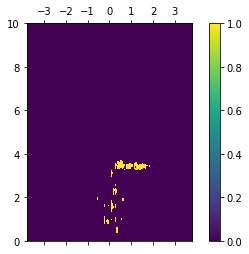

Image n. 91


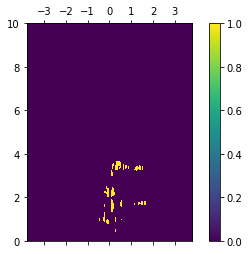

Image n. 92


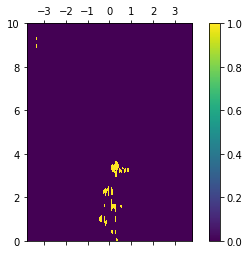

Image n. 93


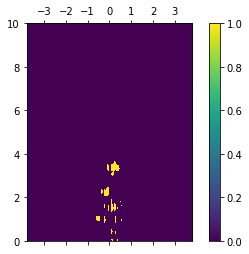

Image n. 94


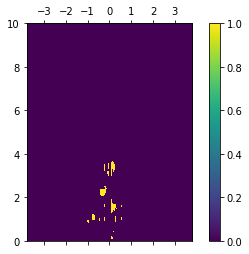

Image n. 95


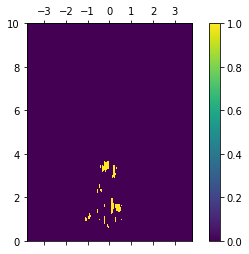

Image n. 96


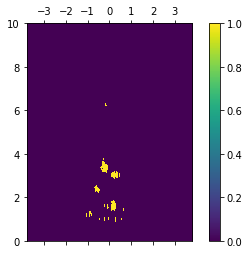

Image n. 97


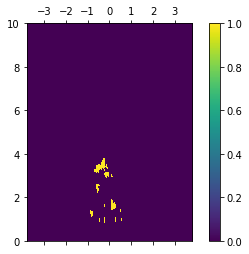

Image n. 98


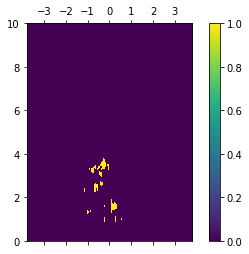

Image n. 99


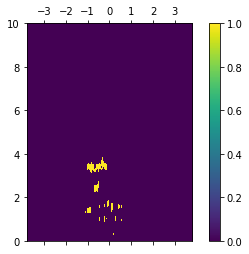

Image n. 100


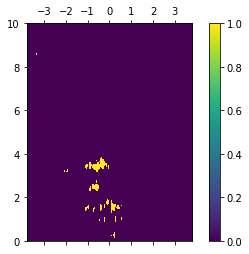

Image n. 101


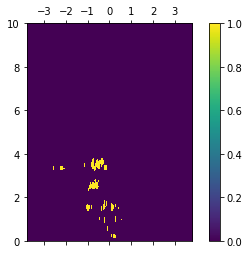

Image n. 102


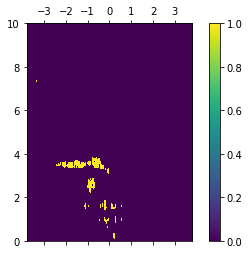

Image n. 103


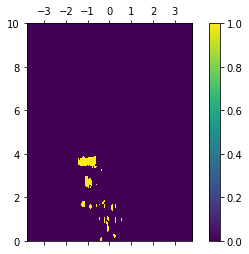

Image n. 104


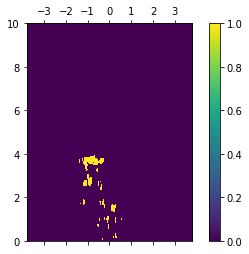

Image n. 105


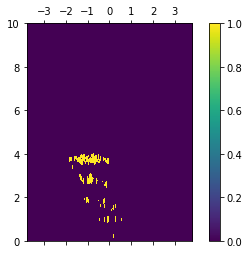

Image n. 106


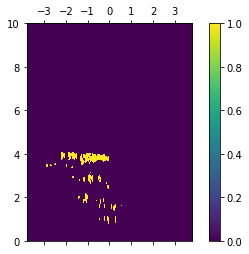

Image n. 107


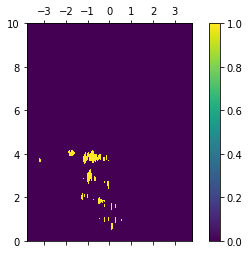

Image n. 108


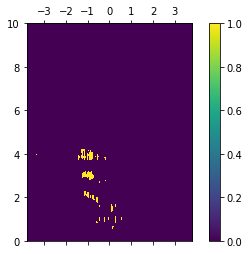

Image n. 109


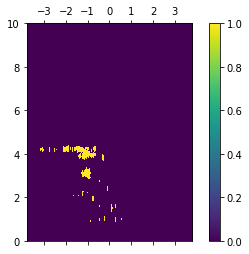

Image n. 110


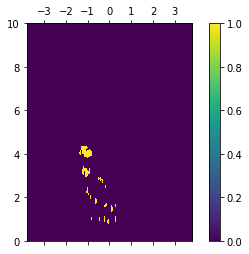

Image n. 111


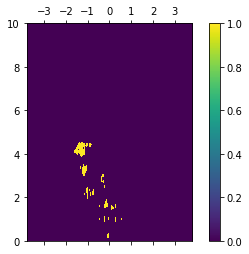

Image n. 112


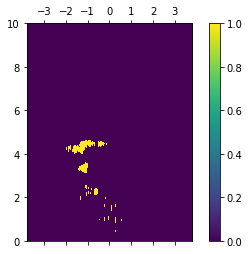

Image n. 113


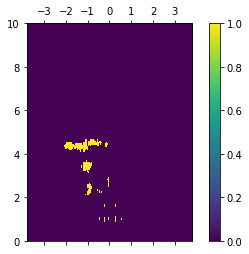

Image n. 114


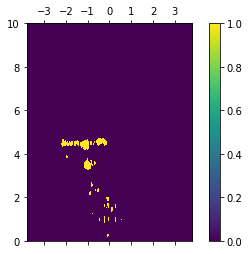

Image n. 115


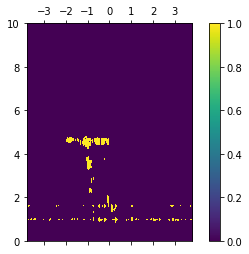

Image n. 116


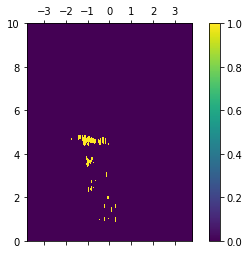

Image n. 117


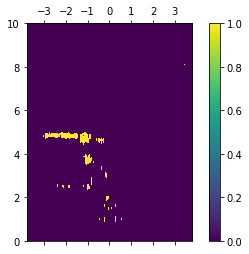

Image n. 118


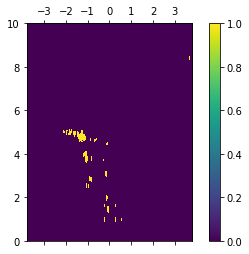

Image n. 119


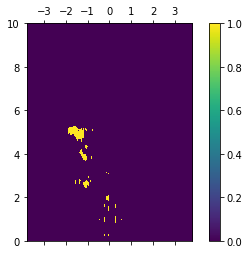

Image n. 120


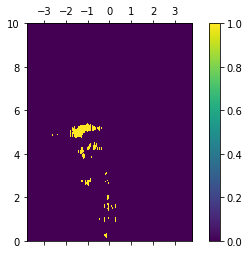

Image n. 121


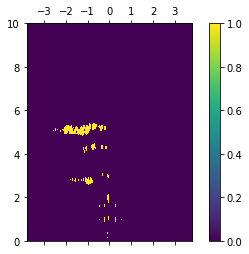

Image n. 122


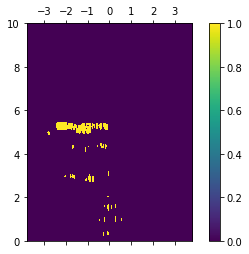

Image n. 123


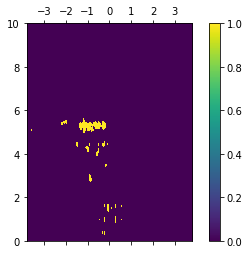

Image n. 124


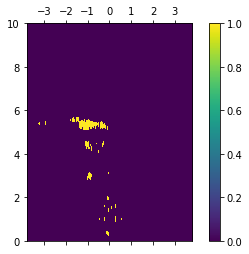

Image n. 125


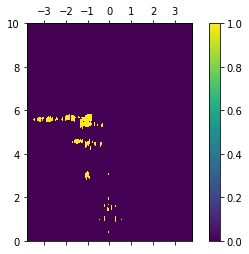

Image n. 126


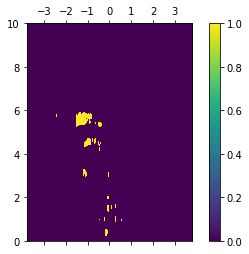

Image n. 127


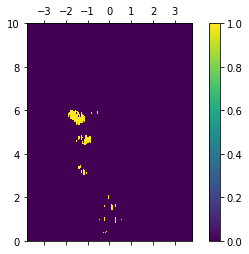

Image n. 128


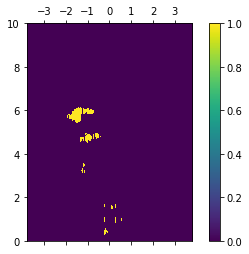

Image n. 129


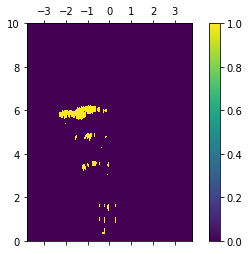

Image n. 130


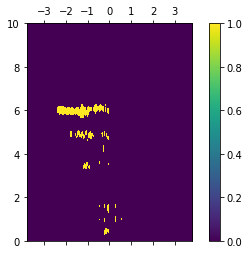

Image n. 131


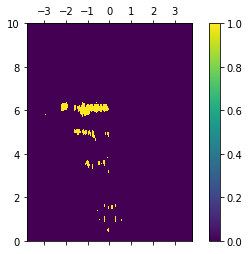

Image n. 132


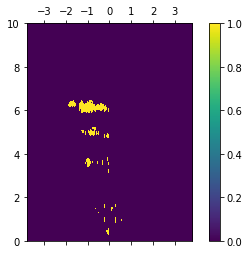

Image n. 133


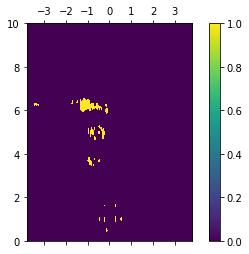

Image n. 134


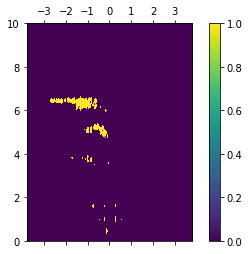

Image n. 135


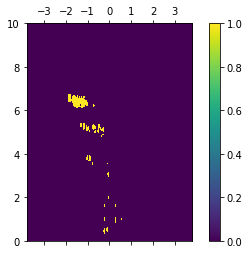

Image n. 136


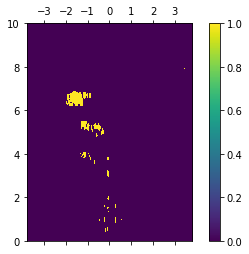

Image n. 137


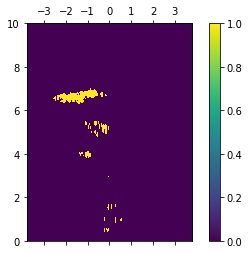

Image n. 138


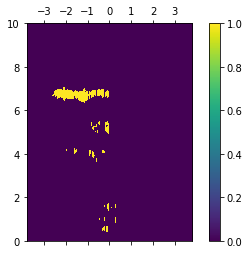

Image n. 139


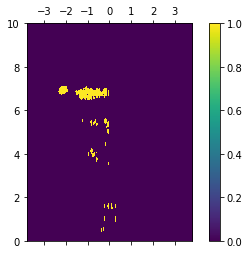

Image n. 140


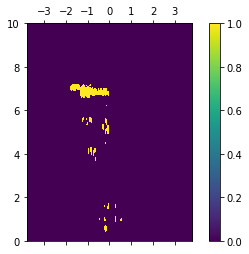

Image n. 141


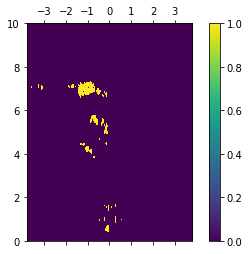

Image n. 142


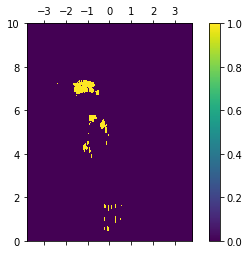

Image n. 143


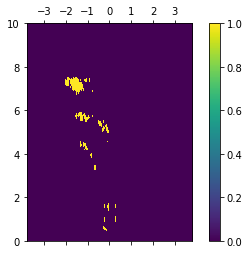

Image n. 144


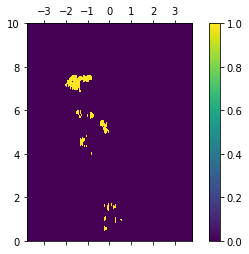

Image n. 145


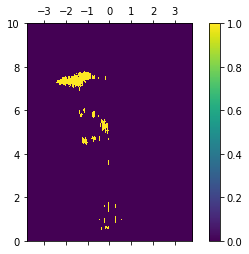

Image n. 146


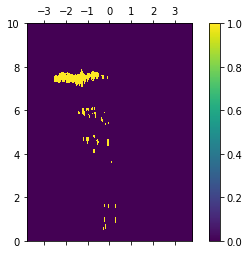

Image n. 147


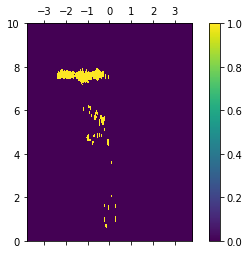

Image n. 148


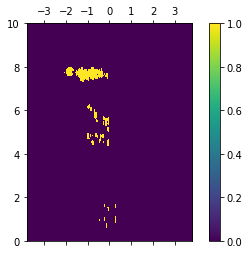

Image n. 149


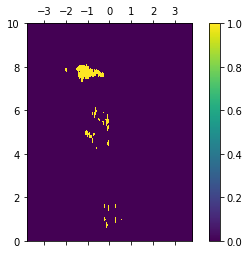

Image n. 150


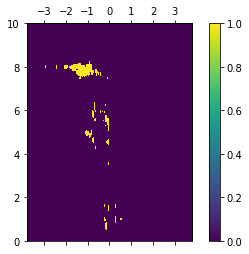

Image n. 151


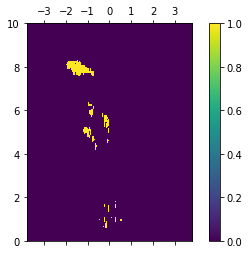

Image n. 152


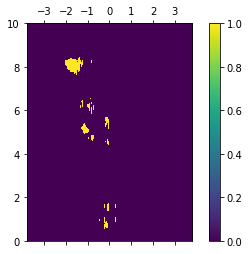

Image n. 153


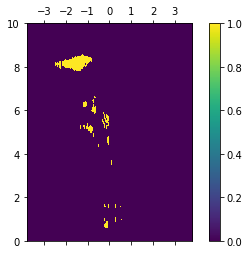

Image n. 154


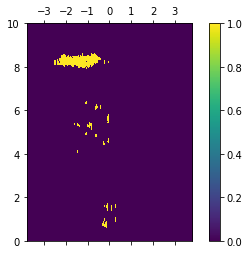

Image n. 155


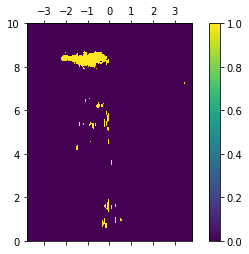

Image n. 156


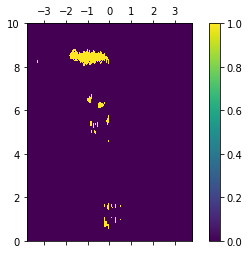

Image n. 157


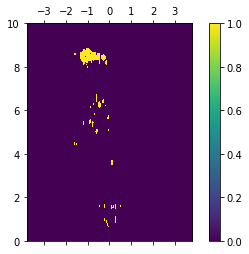

Image n. 158


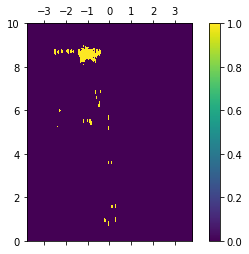

Image n. 159


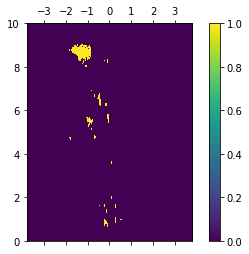

Image n. 160


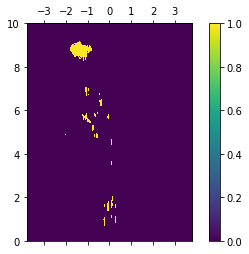

Image n. 161


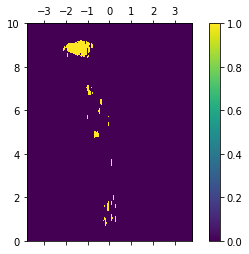

Image n. 162


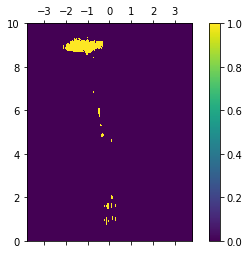

Image n. 163


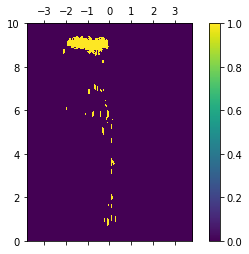

Image n. 164


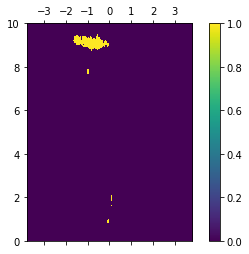

Image n. 165


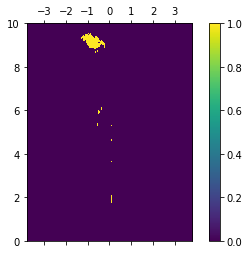

Image n. 166


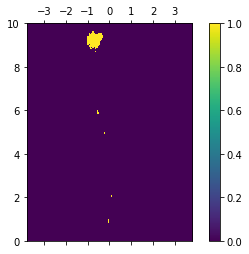

Image n. 167


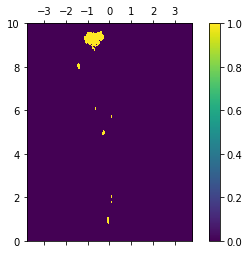

Image n. 168


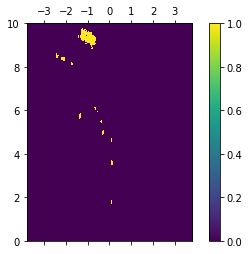

Image n. 169


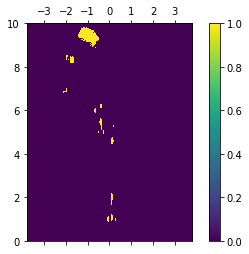

Image n. 170


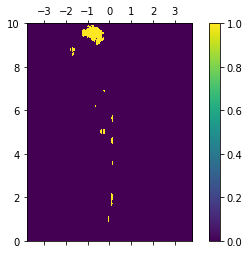

Image n. 171


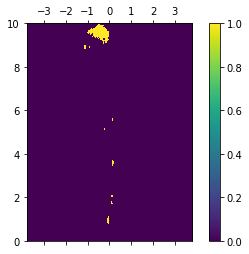

Image n. 172


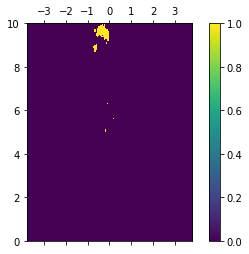

Image n. 173


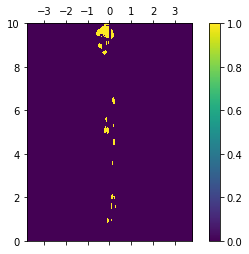

Image n. 174


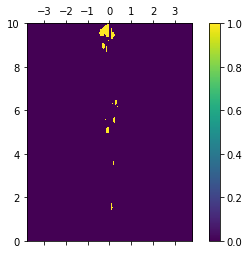

Image n. 175


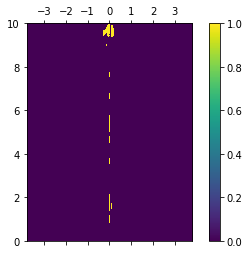

Image n. 176


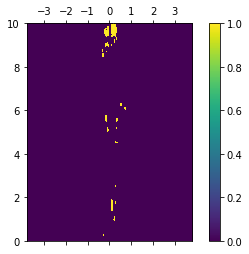

Image n. 177


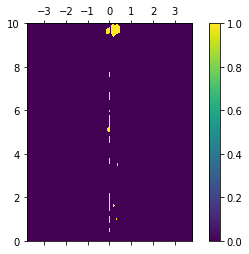

Image n. 178


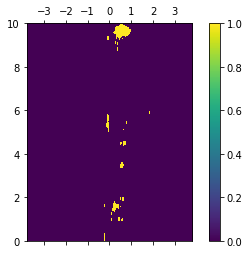

In [65]:
rda_bool = np.empty((n_frame, dim[0], dim[1]))

for i in range(n_frame):
    print('Image n.',i)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    rda_bool[i,:,:] = dns.remove_line(rda_thresh_g[i,:,:])
    ax = ax.matshow(rda_bool[i,:,:], extent=[-3.8,3.8,0,10])
    fig.colorbar(ax)
    plt.show()

In [66]:
with open(PATH+'clean'+CODE+'.p', 'wb') as outfile:
    pickle.dump(rda_bool, outfile)

In [67]:
with open(PATH+'clean'+CODE+'.p', 'rb') as infile:
    rda_bool = pickle.load(infile)

## Means and Variances Extraction
The cluster presenting an estimated centroid with the highest value of intensity is assumed to contain the signal generated by the target movement. The signal shape is approximated by an ellipse whose axis are obtained multiplying by three times the variances of the two coordinates of the points belonging to the selected cluster.

In [68]:
means_true = np.empty((n_frame, 3))
means_noise = np.empty((n_frame, 3))
vars_true = np.empty((n_frame, 2))

for ind in range(n_frame):
    data = dns.select_points(rda_bool[ind], rda[ind])
    labels, m = clr.gaussian_mixtures(data, n_cluster_=2, Verbose=False, Bayesian=False)

    i_true = np.argmax(np.array(m)[:, 2])
    means_true[ind, :] = np.array(m)[i_true, :]

    i_false = np.argmin(np.array(m)[:, 2])
    means_noise[ind, :] = np.array(m)[i_false, :]
    
    var_distance = np.std(data[labels==i_true][:,1])
    var_speed = np.std(data[labels==i_true][:,2])
    vars_true[ind, :] = np.array([var_distance, var_speed])

Those values need to be rescaled in order to be expressed in usual SI units.

In [69]:
height, length = rda[1].shape
means_true[:,0] = 10 - means_true[:,0]*10/height
means_noise[:,0] = 10 - means_noise[:,0]*10/height
vars_true[:,0] = vars_true[:,0]*10/height

means_true[:,1] = -3.8 + means_true[:,1]*7.6/length
means_noise[:,1] = -3.8 + means_noise[:,1]*7.6/length
vars_true[:,1] = vars_true[:,1]*7.6/length

In [70]:
with open('means_vars'+CODE+'.p', 'wb') as outfile:
        pickle.dump((means_true, vars_true), outfile)

## Graphical Representations

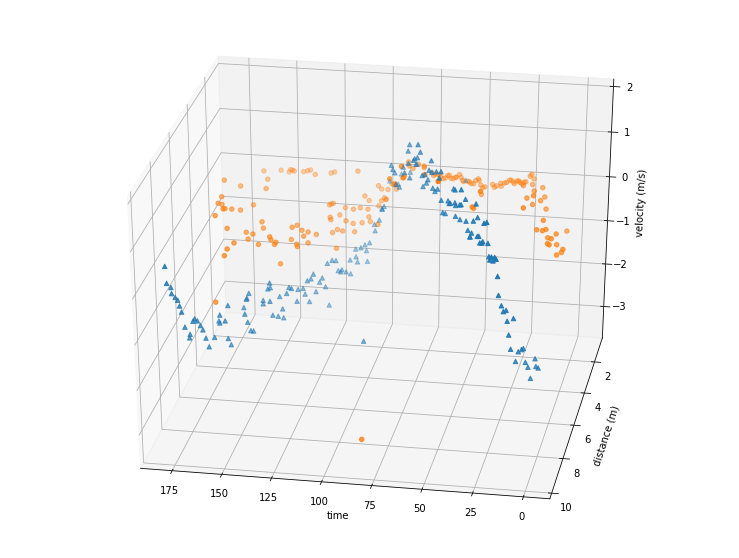

In [71]:
fig = plt.figure(figsize=(13,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(range(n_frame), means_true[:,0], means_true[:,1], marker="^")
ax.scatter(range(n_frame), means_noise[:,0], means_noise[:,1], marker='o')
ax.set_xlabel('time')
ax.set_ylabel('distance (m)')
ax.set_zlabel('velocity (m/s)')
ax.view_init(azim=100)
plt.show()

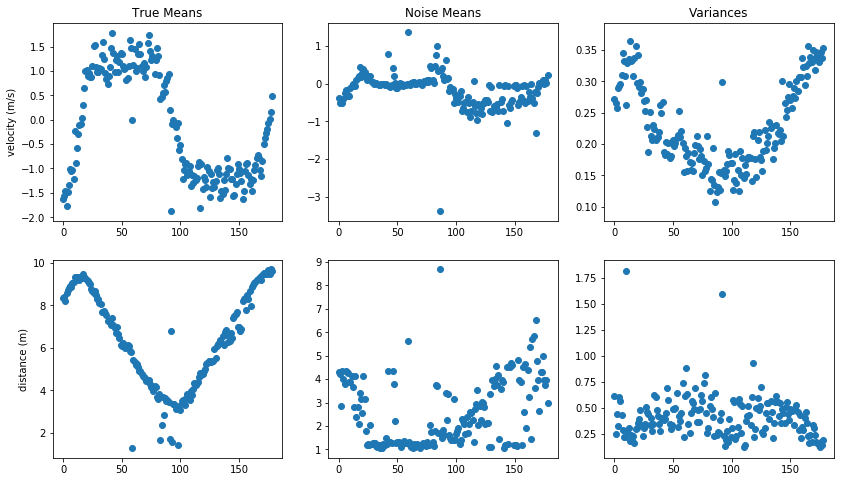

In [72]:
fig = plt.figure(figsize=(14,8))

ax = fig.add_subplot(231)
plt.title('True Means')
plt.ylabel('velocity (m/s)')
#plt.ylim((0,dim))
ax.scatter(range(n_frame), means_true[:,1])

ax = fig.add_subplot(232)
plt.title('Noise Means')
#plt.ylim((0,dim[1]))
ax.scatter(range(n_frame), means_noise[:,1])

ax = fig.add_subplot(233)
plt.title('Variances')
ax.scatter(range(n_frame), vars_true[:,1])

ax = fig.add_subplot(234)
plt.ylabel('distance (m)')
#plt.ylim((0,dim[0]))
ax.scatter(range(n_frame), means_true[:,0])

ax = fig.add_subplot(235)
#plt.ylim((0,dim[0]))
ax.scatter(range(n_frame), means_noise[:,0])

ax = fig.add_subplot(236)
ax.scatter(range(n_frame), vars_true[:,0])

plt.show()

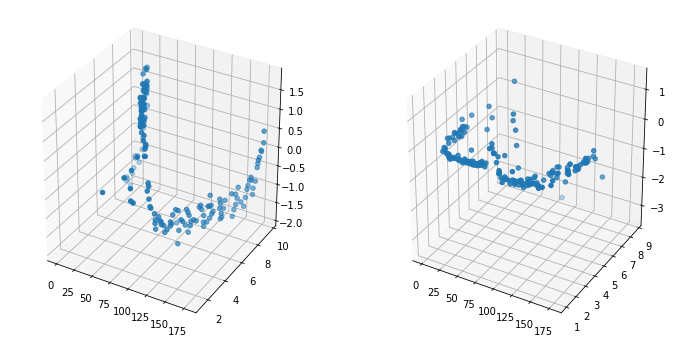

In [73]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(range(n_frame), means_true[:,0], means_true[:,1])
ax = fig.add_subplot(122, projection='3d')
ax.scatter(range(n_frame), means_noise[:,0], means_noise[:,1])
plt.show()